In [1]:
# Parameters
uid_list = None


# Template of  jupyter notebook for analysis of SAXS/WAXS/GiSAXS/GiWAXS

## Load package

In [2]:
#%matplotlib notebook
%matplotlib inline
from pyScatt.packages import *
plt.rcParams.update({'figure.max_open_warning': 0})
plt.rcParams.update({ 'image.origin': 'lower'   })
plt.rcParams.update({ 'image.interpolation': 'none'   })
T = True
F = False

## Define IO

In [3]:
inDir =  '/home/group/NSLSII_Data/SMI/2021_Cycle1/304841_Kim/300KW/'
#inDir = '/home/yuzhang/NSLSII_Data_Link/SMI/2020_Cycle3/308052_Zhang/raw_data/300KW/'


print('The input dir is: %s'%inDir)



The input dir is: /home/group/NSLSII_Data/SMI/2021_Cycle1/304841_Kim/300KW/


In [4]:
outDir = '/home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/'
#outDir = '/home/yuzhang/NSLSII_Data_Link/SMI/2020_Cycle3/308052_Zhang/Results/Yugang/'
outDir = create_fullpath(  outDir )

outDir_HDF =  create_dir(  'HDF_Results/', outDir )
outDir_PDF =  create_dir(  'PDF_Report/', outDir )

Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/  already exists
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/HDF_Results/  already exists
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/PDF_Report/  already exists


## Organize Data 
* the sorting method heavly relies on data acquisition strategy
* Currently, there is no general method for sorting

In [5]:
username_ = 'Kim'


flist = ls_dir( inDir, and_list=[  username_,  ], no_list=[  ])
#_, flists = sort_fnlist( flist,  cut_beg = -24, cut_end=-9, method = 'cut_from_end' ) #for waxs
flists = flist

#flists_clean = drop_xyz_float_filenames( flists, pattern_characters = ['_x', '_y', '_z', '_w' ] )
#flists_clean = drop_xyz_float_filenames( flists, pattern_characters = ['_x', '_w'  ] )
flists_clean = flist
Nf = len( flists)
print('There are %s files for user: %s in this run.'%(Nf, username_))

There are 5670 files for user: Kim in this run.


In [6]:
# 70 samples * 3 position * 9 waxs angles * 3 inc_ang 
70*3*9*3,  4*3*9*3

(5670, 324)

In [7]:
flist

array(['Kim_2021C1_F53_0.1000deg_waxsN13.00_x-39000.00_expt1s_sid00267371_000001_WAXS.tif',
       'Kim_2021C1_F61_0.0800deg_waxsN19.50_x45000.00_expt1s_sid00268565_000001_WAXS.tif',
       'Kim_2021C1_E46_0.1500deg_waxsP06.50_x1500.00_expt1s_sid00266708_000001_WAXS.tif',
       ...,
       'Kim_2021C1_E43_0.0800deg_waxsN52.00_x20000.00_expt1s_sid00266436_000001_WAXS.tif',
       'Kim_2021C1_F65_0.1500deg_waxsN39.00_x16900.00_expt1s_sid00268889_000001_WAXS.tif',
       'Kim_2021C1_A8_0.1000deg_waxsP52.00_x11000.00_expt1s_sid00262617_000001_WAXS.tif'],
      dtype='<U81')

In [8]:
flists_clean

array(['Kim_2021C1_F53_0.1000deg_waxsN13.00_x-39000.00_expt1s_sid00267371_000001_WAXS.tif',
       'Kim_2021C1_F61_0.0800deg_waxsN19.50_x45000.00_expt1s_sid00268565_000001_WAXS.tif',
       'Kim_2021C1_E46_0.1500deg_waxsP06.50_x1500.00_expt1s_sid00266708_000001_WAXS.tif',
       ...,
       'Kim_2021C1_E43_0.0800deg_waxsN52.00_x20000.00_expt1s_sid00266436_000001_WAXS.tif',
       'Kim_2021C1_F65_0.1500deg_waxsN39.00_x16900.00_expt1s_sid00268889_000001_WAXS.tif',
       'Kim_2021C1_A8_0.1000deg_waxsP52.00_x11000.00_expt1s_sid00262617_000001_WAXS.tif'],
      dtype='<U81')

### Using a two-layered dict to sort the files 

In [9]:
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/generic_functions.py

In [10]:
#cut_pattern= r'(_waxs)'
cut_pattern= r'(_waxs)'
#cut_pattern= r'(_deg)'
sam_dict, sams = get_Unique_SamDict_from_list( flists, sam_list_clean=flists_clean, 
                                               cut_pattern= cut_pattern, starting_point=  0     )   
#ks =  sorted(list(sams.keys()))
ks =   sorted(list(sams.keys()))
N = len(ks)
print( 'There are %s samples.'%(N))

There are 210 samples.


In [11]:
ks

['Kim_2021C1B17_0.0800deg',
 'Kim_2021C1B17_0.1000deg',
 'Kim_2021C1B17_0.1500deg',
 'Kim_2021C1_A1_0.0800deg',
 'Kim_2021C1_A1_0.1000deg',
 'Kim_2021C1_A1_0.1500deg',
 'Kim_2021C1_A2_0.0800deg',
 'Kim_2021C1_A2_0.1000deg',
 'Kim_2021C1_A2_0.1500deg',
 'Kim_2021C1_A3_0.0800deg',
 'Kim_2021C1_A3_0.1000deg',
 'Kim_2021C1_A3_0.1500deg',
 'Kim_2021C1_A4_0.0800deg',
 'Kim_2021C1_A4_0.1000deg',
 'Kim_2021C1_A4_0.1500deg',
 'Kim_2021C1_A5_0.0800deg',
 'Kim_2021C1_A5_0.1000deg',
 'Kim_2021C1_A5_0.1500deg',
 'Kim_2021C1_A6_0.0800deg',
 'Kim_2021C1_A6_0.1000deg',
 'Kim_2021C1_A6_0.1500deg',
 'Kim_2021C1_A7_0.0800deg',
 'Kim_2021C1_A7_0.1000deg',
 'Kim_2021C1_A7_0.1500deg',
 'Kim_2021C1_A8_0.0800deg',
 'Kim_2021C1_A8_0.1000deg',
 'Kim_2021C1_A8_0.1500deg',
 'Kim_2021C1_B10_0.0800deg',
 'Kim_2021C1_B10_0.1000deg',
 'Kim_2021C1_B10_0.1500deg',
 'Kim_2021C1_B11_0.0800deg',
 'Kim_2021C1_B11_0.1000deg',
 'Kim_2021C1_B11_0.1500deg',
 'Kim_2021C1_B12_0.0800deg',
 'Kim_2021C1_B12_0.1000deg',
 'Kim_2021C1

In [12]:
# import shutil
# inDir
# outDirM = '/home/group/NSLSII_Data/SMI/2021_Cycle1/304841_Kim/Deleted/'



# delts= [     '2021C1_C28','2021C1_C29',
#                    '2021C1_C30','2021C1_C31','2021C1_C32', '2021C1_C33',
#                     '2021C1_D34','2021C1_D35','2021C1_D36', '2021C1_D37', ]
# probs = []
# for k in ks:
#     for d in delts:
#         if d in k:
#             probs.append( k )

    



# for p in probs:
#     fps = sam_dict[ p ] 
#     for fp in fps:
#         sid = int( fp[-24: - 16] )
#         if sid < 265110:
#             original = inDir + fp
#             target = outDirM + fp
#             print(fp)
#             shutil.move(original,target)

In [13]:
sams

{'Kim_2021C1_F53_0.1000deg': 27,
 'Kim_2021C1_F61_0.0800deg': 27,
 'Kim_2021C1_E46_0.1500deg': 27,
 'Kim_2021C1_B24_0.0800deg': 27,
 'Kim_2021C1_B23_0.0800deg': 27,
 'Kim_2021C1_D36_0.0800deg': 27,
 'Kim_2021C1_B10_0.1500deg': 27,
 'Kim_2021C1_E49_0.1500deg': 27,
 'Kim_2021C1_C32_0.1000deg': 27,
 'Kim_2021C1_F66_0.1500deg': 27,
 'Kim_2021C1_B12_0.1500deg': 27,
 'Kim_2021C1_F57_0.0800deg': 27,
 'Kim_2021C1_B20_0.1000deg': 27,
 'Kim_2021C1_C30_0.1500deg': 27,
 'Kim_2021C1_F60_0.1500deg': 27,
 'Kim_2021C1_F69_0.1500deg': 27,
 'Kim_2021C1_D40_0.0800deg': 27,
 'Kim_2021C1_A6_0.0800deg': 27,
 'Kim_2021C1_A4_0.0800deg': 27,
 'Kim_2021C1_E44_0.1500deg': 27,
 'Kim_2021C1_D39_0.1500deg': 27,
 'Kim_2021C1_F51_0.0800deg': 27,
 'Kim_2021C1_D34_0.1500deg': 27,
 'Kim_2021C1_D41_0.0800deg': 27,
 'Kim_2021C1_B10_0.0800deg': 27,
 'Kim_2021C1_E43_0.1500deg': 27,
 'Kim_2021C1_B11_0.0800deg': 27,
 'Kim_2021C1_B13_0.1500deg': 27,
 'Kim_2021C1_F59_0.1000deg': 27,
 'Kim_2021C1_B11_0.1000deg': 27,
 'Kim_2021C1

 ## Create another layer of samples

In [14]:
Sam_dict = {}

for k in ks:
#for k in [ ks[0] ] :
    fdict, fl = sort_fnlist( sam_dict[k], pattern='_sid', lsid = 7, cut_beg = -24, cut_end=-16, method='cut_from_end' )
    if 'waxsN' in fl[0]:
        FL = fl[::-1]
    else:
        FL = fl
    Sam_dict[k + '_pos1'] = FL[::3]
    Sam_dict[k + '_pos2'] = FL[1::3]
    Sam_dict[k + '_pos3'] = FL[2::3]    
 
ks =   sorted(list(Sam_dict.keys()))
N = len(ks)
print( 'There are %s samples.'%(N))        
    

There are 630 samples.


In [15]:
 # 70 samples *  3 inc *  3 position   #9 angles

##  Load Mask if has one

In [16]:
#mask  =np.load( '/home/yuzhang/NSLSII_Data_Link/SMI/2020_Cycle3/308052_Zhang/Mask/mask_waxs_2020C3_YG.npy')
#show_img(mask)
mask = None

## Define data analysis parameters and methods

### A GiWAXS

In [17]:
username = 'Kim'
beamline = 'SMI'
cycle='2021_C1'


geometry   =  'Reflection'
det_str =  'Pilatus300kw'

wav_m = 1E-10 * (12.398/16.1)
sdd_mm = 274.0
b_xy = [96,  1475 - 88  ]   #[ 88, 96  ]
bs_xy = [96, 1203]         #
incident_angle = 0
hotpixel_thres = 1e6
  
pargs_sc = dict( wav_m = wav_m, 
                sdd_mm = sdd_mm, 
                b_xy =b_xy, 
                bs_xy = bs_xy, 
                incident_angle = incident_angle,             
                det_str = det_str, 
                bs_kind = None, 
                useqx = True,
                geometry =  geometry,                
                username = username, 
                cycle =  cycle, 
                beamline = beamline, 
                outDir = outDir, )
              # mask = mask )
    

rot_angle_start = 0
rot_angle_step = 6.5     
## Setup the class
SC = SMI_Scattering( pargs_sc  )
 


### Methods

In [18]:
do_plot = T #True 
#do_inpait = True, make it True, the circular average does not use inpaited data 
do_show_plot = T
save_raw = F
do_qimg = F
do_ciravg = F
save_raw= F
check_stitch = F
do_stitch = F
do_Qciravg = F
show_Qciravg_roi = F 
do_Qciravg_sector = F   
show_Qciravg_sector = F 
do_Qqphi = F 
do_q_qphi = F
do_p_qphi = F  


if T:    
    ###########################
    #for GiWAXS
    ###########################  
    do_plot_raw = F # True
    check_stitch = F
    do_stitch = T
    do_plot_stich = F
    save_stitch_to_tiff = F
    do_Qciravg = T
    show_Qciravg_roi = F     
    do_Qciravg_sector =  F  
    show_Qciravg_sector = F    
    Qciravg_sector_angle_wid = 10 
    Qciravg_sector_angles = [  10,  30,  50, 70, 90    ]   
    
    do_Qqphi = F
    do_q_qphi = F
    do_p_qphi = F
 
    
#ThresN = 100000



In [19]:
sample_list = ks 

#sample_list =[  ks[ 18 ]  ]

sample_list =   ks[450:]    
#sample_list = ks   #use a dummy papemill to run this
print( len(sample_list))
print( sample_list )

180
['Kim_2021C1_F51_0.0800deg_pos1', 'Kim_2021C1_F51_0.0800deg_pos2', 'Kim_2021C1_F51_0.0800deg_pos3', 'Kim_2021C1_F51_0.1000deg_pos1', 'Kim_2021C1_F51_0.1000deg_pos2', 'Kim_2021C1_F51_0.1000deg_pos3', 'Kim_2021C1_F51_0.1500deg_pos1', 'Kim_2021C1_F51_0.1500deg_pos2', 'Kim_2021C1_F51_0.1500deg_pos3', 'Kim_2021C1_F52_0.0800deg_pos1', 'Kim_2021C1_F52_0.0800deg_pos2', 'Kim_2021C1_F52_0.0800deg_pos3', 'Kim_2021C1_F52_0.1000deg_pos1', 'Kim_2021C1_F52_0.1000deg_pos2', 'Kim_2021C1_F52_0.1000deg_pos3', 'Kim_2021C1_F52_0.1500deg_pos1', 'Kim_2021C1_F52_0.1500deg_pos2', 'Kim_2021C1_F52_0.1500deg_pos3', 'Kim_2021C1_F53_0.0800deg_pos1', 'Kim_2021C1_F53_0.0800deg_pos2', 'Kim_2021C1_F53_0.0800deg_pos3', 'Kim_2021C1_F53_0.1000deg_pos1', 'Kim_2021C1_F53_0.1000deg_pos2', 'Kim_2021C1_F53_0.1000deg_pos3', 'Kim_2021C1_F53_0.1500deg_pos1', 'Kim_2021C1_F53_0.1500deg_pos2', 'Kim_2021C1_F53_0.1500deg_pos3', 'Kim_2021C1_F54_0.0800deg_pos1', 'Kim_2021C1_F54_0.0800deg_pos2', 'Kim_2021C1_F54_0.0800deg_pos3', 'Kim_

In [20]:
sample_list

['Kim_2021C1_F51_0.0800deg_pos1',
 'Kim_2021C1_F51_0.0800deg_pos2',
 'Kim_2021C1_F51_0.0800deg_pos3',
 'Kim_2021C1_F51_0.1000deg_pos1',
 'Kim_2021C1_F51_0.1000deg_pos2',
 'Kim_2021C1_F51_0.1000deg_pos3',
 'Kim_2021C1_F51_0.1500deg_pos1',
 'Kim_2021C1_F51_0.1500deg_pos2',
 'Kim_2021C1_F51_0.1500deg_pos3',
 'Kim_2021C1_F52_0.0800deg_pos1',
 'Kim_2021C1_F52_0.0800deg_pos2',
 'Kim_2021C1_F52_0.0800deg_pos3',
 'Kim_2021C1_F52_0.1000deg_pos1',
 'Kim_2021C1_F52_0.1000deg_pos2',
 'Kim_2021C1_F52_0.1000deg_pos3',
 'Kim_2021C1_F52_0.1500deg_pos1',
 'Kim_2021C1_F52_0.1500deg_pos2',
 'Kim_2021C1_F52_0.1500deg_pos3',
 'Kim_2021C1_F53_0.0800deg_pos1',
 'Kim_2021C1_F53_0.0800deg_pos2',
 'Kim_2021C1_F53_0.0800deg_pos3',
 'Kim_2021C1_F53_0.1000deg_pos1',
 'Kim_2021C1_F53_0.1000deg_pos2',
 'Kim_2021C1_F53_0.1000deg_pos3',
 'Kim_2021C1_F53_0.1500deg_pos1',
 'Kim_2021C1_F53_0.1500deg_pos2',
 'Kim_2021C1_F53_0.1500deg_pos3',
 'Kim_2021C1_F54_0.0800deg_pos1',
 'Kim_2021C1_F54_0.0800deg_pos2',
 'Kim_2021C1_F

In [21]:
#ks[450:]

In [22]:
 Sam_dict[sample_list[ 0 ]], len( Sam_dict[sample_list[ 0 ]] )

(['Kim_2021C1_F51_0.0800deg_waxsN00.00_x-27000.00_expt1s_sid00267212_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN06.50_x-27000.00_expt1s_sid00267203_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN13.00_x-27000.00_expt1s_sid00267194_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN19.50_x-27000.00_expt1s_sid00267185_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN26.00_x-27000.00_expt1s_sid00267176_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN32.50_x-27000.00_expt1s_sid00267167_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN39.00_x-27000.00_expt1s_sid00267158_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN45.50_x-27000.00_expt1s_sid00267149_000001_WAXS.tif',
  'Kim_2021C1_F51_0.0800deg_waxsN52.00_x-27000.00_expt1s_sid00267140_000001_WAXS.tif'],
 9)

In [23]:
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/Pipeline_Funcs.py

# Run the data analysis

The sample is: Kim_2021C1_F51_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F51_0.0800deg_waxsN00.00_x-27000.00_expt1s_sid00267212_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN06.50_x-27000.00_expt1s_sid00267203_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN13.00_x-27000.00_expt1s_sid00267194_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN19.50_x-27000.00_expt1s_sid00267185_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN26.00_x-27000.00_expt1s_sid00267176_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN32.50_x-27000.00_expt1s_sid00267167_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN39.00_x-27000.00_expt1s_sid00267158_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN45.50_x-27000.00_expt1s_sid00267149_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN52.00_x-27000.00_expt1s_sid00267140_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F51_0.0800deg_waxsN00.00_x-27500.00_expt1s_sid00267209_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN06.50_x-27500.00_expt1s_sid00267200_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN13.00_x-27500.00_expt1s_sid00267191_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN19.50_x-27500.00_expt1s_sid00267182_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN26.00_x-27500.00_expt1s_sid00267173_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN32.50_x-27500.00_expt1s_sid00267164_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN39.00_x-27500.00_expt1s_sid00267155_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN45.50_x-27500.00_expt1s_sid00267146_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN52.00_x-27500.00_expt1s_sid00267137_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F51_0.0800deg_waxsN00.00_x-28000.00_expt1s_sid00267206_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN06.50_x-28000.00_expt1s_sid00267197_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN13.00_x-28000.00_expt1s_sid00267188_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN19.50_x-28000.00_expt1s_sid00267179_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN26.00_x-28000.00_expt1s_sid00267170_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN32.50_x-28000.00_expt1s_sid00267161_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN39.00_x-28000.00_expt1s_sid00267152_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN45.50_x-28000.00_expt1s_sid00267143_000001_WAXS.tif', 'Kim_2021C1_F51_0.0800deg_waxsN52.00_x-28000.00_expt1s_sid00267134_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F51_0.1000deg_waxsN00.00_x-27000.00_expt1s_sid00267213_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN06.50_x-27000.00_expt1s_sid00267204_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN13.00_x-27000.00_expt1s_sid00267195_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN19.50_x-27000.00_expt1s_sid00267186_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN26.00_x-27000.00_expt1s_sid00267177_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN32.50_x-27000.00_expt1s_sid00267168_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN39.00_x-27000.00_expt1s_sid00267159_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN45.50_x-27000.00_expt1s_sid00267150_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN52.00_x-27000.00_expt1s_sid00267141_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F51_0.1000deg_waxsN00.00_x-27500.00_expt1s_sid00267210_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN06.50_x-27500.00_expt1s_sid00267201_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN13.00_x-27500.00_expt1s_sid00267192_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN19.50_x-27500.00_expt1s_sid00267183_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN26.00_x-27500.00_expt1s_sid00267174_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN32.50_x-27500.00_expt1s_sid00267165_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN39.00_x-27500.00_expt1s_sid00267156_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN45.50_x-27500.00_expt1s_sid00267147_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN52.00_x-27500.00_expt1s_sid00267138_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F51_0.1000deg_waxsN00.00_x-28000.00_expt1s_sid00267207_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN06.50_x-28000.00_expt1s_sid00267198_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN13.00_x-28000.00_expt1s_sid00267189_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN19.50_x-28000.00_expt1s_sid00267180_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN26.00_x-28000.00_expt1s_sid00267171_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN32.50_x-28000.00_expt1s_sid00267162_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN39.00_x-28000.00_expt1s_sid00267153_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN45.50_x-28000.00_expt1s_sid00267144_000001_WAXS.tif', 'Kim_2021C1_F51_0.1000deg_waxsN52.00_x-28000.00_expt1s_sid00267135_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F51_0.1500deg_waxsN00.00_x-27000.00_expt1s_sid00267214_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN06.50_x-27000.00_expt1s_sid00267205_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN13.00_x-27000.00_expt1s_sid00267196_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN19.50_x-27000.00_expt1s_sid00267187_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN26.00_x-27000.00_expt1s_sid00267178_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN32.50_x-27000.00_expt1s_sid00267169_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN39.00_x-27000.00_expt1s_sid00267160_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN45.50_x-27000.00_expt1s_sid00267151_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN52.00_x-27000.00_expt1s_sid00267142_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F51_0.1500deg_waxsN00.00_x-27500.00_expt1s_sid00267211_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN06.50_x-27500.00_expt1s_sid00267202_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN13.00_x-27500.00_expt1s_sid00267193_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN19.50_x-27500.00_expt1s_sid00267184_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN26.00_x-27500.00_expt1s_sid00267175_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN32.50_x-27500.00_expt1s_sid00267166_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN39.00_x-27500.00_expt1s_sid00267157_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN45.50_x-27500.00_expt1s_sid00267148_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN52.00_x-27500.00_expt1s_sid00267139_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F51_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F51_0.1500deg_waxsN00.00_x-28000.00_expt1s_sid00267208_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN06.50_x-28000.00_expt1s_sid00267199_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN13.00_x-28000.00_expt1s_sid00267190_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN19.50_x-28000.00_expt1s_sid00267181_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN26.00_x-28000.00_expt1s_sid00267172_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN32.50_x-28000.00_expt1s_sid00267163_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN39.00_x-28000.00_expt1s_sid00267154_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN45.50_x-28000.00_expt1s_sid00267145_000001_WAXS.tif', 'Kim_2021C1_F51_0.1500deg_waxsN52.00_x-28000.00_expt1s_sid00267136_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F51_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F52_0.0800deg_waxsP00.00_x-34000.00_expt1s_sid00267222_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP06.50_x-34000.00_expt1s_sid00267231_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP13.00_x-34000.00_expt1s_sid00267240_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP19.50_x-34000.00_expt1s_sid00267249_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP26.00_x-34000.00_expt1s_sid00267258_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP32.50_x-34000.00_expt1s_sid00267267_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP39.00_x-34000.00_expt1s_sid00267276_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP45.50_x-34000.00_expt1s_sid00267285_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP52.00_x-34000.00_expt1s_sid00267294_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F52_0.0800deg_waxsP00.00_x-33500.00_expt1s_sid00267225_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP06.50_x-33500.00_expt1s_sid00267234_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP13.00_x-33500.00_expt1s_sid00267243_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP19.50_x-33500.00_expt1s_sid00267252_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP26.00_x-33500.00_expt1s_sid00267261_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP32.50_x-33500.00_expt1s_sid00267270_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP39.00_x-33500.00_expt1s_sid00267279_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP45.50_x-33500.00_expt1s_sid00267288_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP52.00_x-33500.00_expt1s_sid00267297_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F52_0.0800deg_waxsP00.00_x-33000.00_expt1s_sid00267228_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP06.50_x-33000.00_expt1s_sid00267237_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP13.00_x-33000.00_expt1s_sid00267246_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP19.50_x-33000.00_expt1s_sid00267255_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP26.00_x-33000.00_expt1s_sid00267264_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP32.50_x-33000.00_expt1s_sid00267273_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP39.00_x-33000.00_expt1s_sid00267282_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP45.50_x-33000.00_expt1s_sid00267291_000001_WAXS.tif', 'Kim_2021C1_F52_0.0800deg_waxsP52.00_x-33000.00_expt1s_sid00267300_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F52_0.1000deg_waxsP00.00_x-34000.00_expt1s_sid00267223_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP06.50_x-34000.00_expt1s_sid00267232_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP13.00_x-34000.00_expt1s_sid00267241_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP19.50_x-34000.00_expt1s_sid00267250_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP26.00_x-34000.00_expt1s_sid00267259_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP32.50_x-34000.00_expt1s_sid00267268_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP39.00_x-34000.00_expt1s_sid00267277_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP45.50_x-34000.00_expt1s_sid00267286_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP52.00_x-34000.00_expt1s_sid00267295_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F52_0.1000deg_waxsP00.00_x-33500.00_expt1s_sid00267226_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP06.50_x-33500.00_expt1s_sid00267235_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP13.00_x-33500.00_expt1s_sid00267244_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP19.50_x-33500.00_expt1s_sid00267253_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP26.00_x-33500.00_expt1s_sid00267262_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP32.50_x-33500.00_expt1s_sid00267271_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP39.00_x-33500.00_expt1s_sid00267280_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP45.50_x-33500.00_expt1s_sid00267289_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP52.00_x-33500.00_expt1s_sid00267298_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F52_0.1000deg_waxsP00.00_x-33000.00_expt1s_sid00267229_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP06.50_x-33000.00_expt1s_sid00267238_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP13.00_x-33000.00_expt1s_sid00267247_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP19.50_x-33000.00_expt1s_sid00267256_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP26.00_x-33000.00_expt1s_sid00267265_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP32.50_x-33000.00_expt1s_sid00267274_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP39.00_x-33000.00_expt1s_sid00267283_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP45.50_x-33000.00_expt1s_sid00267292_000001_WAXS.tif', 'Kim_2021C1_F52_0.1000deg_waxsP52.00_x-33000.00_expt1s_sid00267301_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F52_0.1500deg_waxsP00.00_x-34000.00_expt1s_sid00267224_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP06.50_x-34000.00_expt1s_sid00267233_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP13.00_x-34000.00_expt1s_sid00267242_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP19.50_x-34000.00_expt1s_sid00267251_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP26.00_x-34000.00_expt1s_sid00267260_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP32.50_x-34000.00_expt1s_sid00267269_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP39.00_x-34000.00_expt1s_sid00267278_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP45.50_x-34000.00_expt1s_sid00267287_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP52.00_x-34000.00_expt1s_sid00267296_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F52_0.1500deg_waxsP00.00_x-33500.00_expt1s_sid00267227_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP06.50_x-33500.00_expt1s_sid00267236_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP13.00_x-33500.00_expt1s_sid00267245_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP19.50_x-33500.00_expt1s_sid00267254_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP26.00_x-33500.00_expt1s_sid00267263_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP32.50_x-33500.00_expt1s_sid00267272_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP39.00_x-33500.00_expt1s_sid00267281_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP45.50_x-33500.00_expt1s_sid00267290_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP52.00_x-33500.00_expt1s_sid00267299_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F52_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F52_0.1500deg_waxsP00.00_x-33000.00_expt1s_sid00267230_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP06.50_x-33000.00_expt1s_sid00267239_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP13.00_x-33000.00_expt1s_sid00267248_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP19.50_x-33000.00_expt1s_sid00267257_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP26.00_x-33000.00_expt1s_sid00267266_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP32.50_x-33000.00_expt1s_sid00267275_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP39.00_x-33000.00_expt1s_sid00267284_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP45.50_x-33000.00_expt1s_sid00267293_000001_WAXS.tif', 'Kim_2021C1_F52_0.1500deg_waxsP52.00_x-33000.00_expt1s_sid00267302_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F52_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F53_0.0800deg_waxsN00.00_x-39000.00_expt1s_sid00267388_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN06.50_x-39000.00_expt1s_sid00267379_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN13.00_x-39000.00_expt1s_sid00267370_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN19.50_x-39000.00_expt1s_sid00267361_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN26.00_x-39000.00_expt1s_sid00267352_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN32.50_x-39000.00_expt1s_sid00267343_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN39.00_x-39000.00_expt1s_sid00267334_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN45.50_x-39000.00_expt1s_sid00267325_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN52.00_x-39000.00_expt1s_sid00267316_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F53_0.0800deg_waxsN00.00_x-39500.00_expt1s_sid00267385_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN06.50_x-39500.00_expt1s_sid00267376_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN13.00_x-39500.00_expt1s_sid00267367_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN19.50_x-39500.00_expt1s_sid00267358_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN26.00_x-39500.00_expt1s_sid00267349_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN32.50_x-39500.00_expt1s_sid00267340_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN39.00_x-39500.00_expt1s_sid00267331_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN45.50_x-39500.00_expt1s_sid00267322_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN52.00_x-39500.00_expt1s_sid00267313_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F53_0.0800deg_waxsN00.00_x-40000.00_expt1s_sid00267382_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN06.50_x-40000.00_expt1s_sid00267373_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN13.00_x-40000.00_expt1s_sid00267364_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN19.50_x-40000.00_expt1s_sid00267355_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN26.00_x-40000.00_expt1s_sid00267346_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN32.50_x-40000.00_expt1s_sid00267337_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN39.00_x-40000.00_expt1s_sid00267328_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN45.50_x-40000.00_expt1s_sid00267319_000001_WAXS.tif', 'Kim_2021C1_F53_0.0800deg_waxsN52.00_x-40000.00_expt1s_sid00267310_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F53_0.1000deg_waxsN00.00_x-39000.00_expt1s_sid00267389_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN06.50_x-39000.00_expt1s_sid00267380_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN13.00_x-39000.00_expt1s_sid00267371_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN19.50_x-39000.00_expt1s_sid00267362_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN26.00_x-39000.00_expt1s_sid00267353_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN32.50_x-39000.00_expt1s_sid00267344_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN39.00_x-39000.00_expt1s_sid00267335_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN45.50_x-39000.00_expt1s_sid00267326_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN52.00_x-39000.00_expt1s_sid00267317_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F53_0.1000deg_waxsN00.00_x-39500.00_expt1s_sid00267386_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN06.50_x-39500.00_expt1s_sid00267377_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN13.00_x-39500.00_expt1s_sid00267368_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN19.50_x-39500.00_expt1s_sid00267359_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN26.00_x-39500.00_expt1s_sid00267350_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN32.50_x-39500.00_expt1s_sid00267341_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN39.00_x-39500.00_expt1s_sid00267332_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN45.50_x-39500.00_expt1s_sid00267323_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN52.00_x-39500.00_expt1s_sid00267314_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F53_0.1000deg_waxsN00.00_x-40000.00_expt1s_sid00267383_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN06.50_x-40000.00_expt1s_sid00267374_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN13.00_x-40000.00_expt1s_sid00267365_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN19.50_x-40000.00_expt1s_sid00267356_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN26.00_x-40000.00_expt1s_sid00267347_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN32.50_x-40000.00_expt1s_sid00267338_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN39.00_x-40000.00_expt1s_sid00267329_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN45.50_x-40000.00_expt1s_sid00267320_000001_WAXS.tif', 'Kim_2021C1_F53_0.1000deg_waxsN52.00_x-40000.00_expt1s_sid00267311_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F53_0.1500deg_waxsN00.00_x-39000.00_expt1s_sid00267390_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN06.50_x-39000.00_expt1s_sid00267381_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN13.00_x-39000.00_expt1s_sid00267372_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN19.50_x-39000.00_expt1s_sid00267363_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN26.00_x-39000.00_expt1s_sid00267354_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN32.50_x-39000.00_expt1s_sid00267345_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN39.00_x-39000.00_expt1s_sid00267336_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN45.50_x-39000.00_expt1s_sid00267327_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN52.00_x-39000.00_expt1s_sid00267318_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F53_0.1500deg_waxsN00.00_x-39500.00_expt1s_sid00267387_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN06.50_x-39500.00_expt1s_sid00267378_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN13.00_x-39500.00_expt1s_sid00267369_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN19.50_x-39500.00_expt1s_sid00267360_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN26.00_x-39500.00_expt1s_sid00267351_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN32.50_x-39500.00_expt1s_sid00267342_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN39.00_x-39500.00_expt1s_sid00267333_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN45.50_x-39500.00_expt1s_sid00267324_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN52.00_x-39500.00_expt1s_sid00267315_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F53_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F53_0.1500deg_waxsN00.00_x-40000.00_expt1s_sid00267384_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN06.50_x-40000.00_expt1s_sid00267375_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN13.00_x-40000.00_expt1s_sid00267366_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN19.50_x-40000.00_expt1s_sid00267357_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN26.00_x-40000.00_expt1s_sid00267348_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN32.50_x-40000.00_expt1s_sid00267339_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN39.00_x-40000.00_expt1s_sid00267330_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN45.50_x-40000.00_expt1s_sid00267321_000001_WAXS.tif', 'Kim_2021C1_F53_0.1500deg_waxsN52.00_x-40000.00_expt1s_sid00267312_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F53_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F54_0.0800deg_waxsP00.00_x-45000.00_expt1s_sid00267398_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP06.50_x-45000.00_expt1s_sid00267407_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP13.00_x-45000.00_expt1s_sid00267416_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP19.50_x-45000.00_expt1s_sid00267425_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP26.00_x-45000.00_expt1s_sid00267434_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP32.50_x-45000.00_expt1s_sid00267443_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP39.00_x-45000.00_expt1s_sid00267452_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP45.50_x-45000.00_expt1s_sid00267461_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP52.00_x-45000.00_expt1s_sid00267470_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F54_0.0800deg_waxsP00.00_x-44500.00_expt1s_sid00267401_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP06.50_x-44500.00_expt1s_sid00267410_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP13.00_x-44500.00_expt1s_sid00267419_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP19.50_x-44500.00_expt1s_sid00267428_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP26.00_x-44500.00_expt1s_sid00267437_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP32.50_x-44500.00_expt1s_sid00267446_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP39.00_x-44500.00_expt1s_sid00267455_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP45.50_x-44500.00_expt1s_sid00267464_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP52.00_x-44500.00_expt1s_sid00267473_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F54_0.0800deg_waxsP00.00_x-44000.00_expt1s_sid00267404_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP06.50_x-44000.00_expt1s_sid00267413_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP13.00_x-44000.00_expt1s_sid00267422_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP19.50_x-44000.00_expt1s_sid00267431_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP26.00_x-44000.00_expt1s_sid00267440_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP32.50_x-44000.00_expt1s_sid00267449_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP39.00_x-44000.00_expt1s_sid00267458_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP45.50_x-44000.00_expt1s_sid00267467_000001_WAXS.tif', 'Kim_2021C1_F54_0.0800deg_waxsP52.00_x-44000.00_expt1s_sid00267476_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F54_0.1000deg_waxsP00.00_x-45000.00_expt1s_sid00267399_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP06.50_x-45000.00_expt1s_sid00267408_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP13.00_x-45000.00_expt1s_sid00267417_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP19.50_x-45000.00_expt1s_sid00267426_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP26.00_x-45000.00_expt1s_sid00267435_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP32.50_x-45000.00_expt1s_sid00267444_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP39.00_x-45000.00_expt1s_sid00267453_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP45.50_x-45000.00_expt1s_sid00267462_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP52.00_x-45000.00_expt1s_sid00267471_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F54_0.1000deg_waxsP00.00_x-44500.00_expt1s_sid00267402_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP06.50_x-44500.00_expt1s_sid00267411_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP13.00_x-44500.00_expt1s_sid00267420_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP19.50_x-44500.00_expt1s_sid00267429_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP26.00_x-44500.00_expt1s_sid00267438_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP32.50_x-44500.00_expt1s_sid00267447_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP39.00_x-44500.00_expt1s_sid00267456_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP45.50_x-44500.00_expt1s_sid00267465_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP52.00_x-44500.00_expt1s_sid00267474_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F54_0.1000deg_waxsP00.00_x-44000.00_expt1s_sid00267405_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP06.50_x-44000.00_expt1s_sid00267414_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP13.00_x-44000.00_expt1s_sid00267423_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP19.50_x-44000.00_expt1s_sid00267432_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP26.00_x-44000.00_expt1s_sid00267441_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP32.50_x-44000.00_expt1s_sid00267450_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP39.00_x-44000.00_expt1s_sid00267459_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP45.50_x-44000.00_expt1s_sid00267468_000001_WAXS.tif', 'Kim_2021C1_F54_0.1000deg_waxsP52.00_x-44000.00_expt1s_sid00267477_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F54_0.1500deg_waxsP00.00_x-45000.00_expt1s_sid00267400_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP06.50_x-45000.00_expt1s_sid00267409_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP13.00_x-45000.00_expt1s_sid00267418_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP19.50_x-45000.00_expt1s_sid00267427_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP26.00_x-45000.00_expt1s_sid00267436_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP32.50_x-45000.00_expt1s_sid00267445_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP39.00_x-45000.00_expt1s_sid00267454_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP45.50_x-45000.00_expt1s_sid00267463_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP52.00_x-45000.00_expt1s_sid00267472_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F54_0.1500deg_waxsP00.00_x-44500.00_expt1s_sid00267403_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP06.50_x-44500.00_expt1s_sid00267412_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP13.00_x-44500.00_expt1s_sid00267421_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP19.50_x-44500.00_expt1s_sid00267430_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP26.00_x-44500.00_expt1s_sid00267439_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP32.50_x-44500.00_expt1s_sid00267448_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP39.00_x-44500.00_expt1s_sid00267457_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP45.50_x-44500.00_expt1s_sid00267466_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP52.00_x-44500.00_expt1s_sid00267475_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F54_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F54_0.1500deg_waxsP00.00_x-44000.00_expt1s_sid00267406_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP06.50_x-44000.00_expt1s_sid00267415_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP13.00_x-44000.00_expt1s_sid00267424_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP19.50_x-44000.00_expt1s_sid00267433_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP26.00_x-44000.00_expt1s_sid00267442_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP32.50_x-44000.00_expt1s_sid00267451_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP39.00_x-44000.00_expt1s_sid00267460_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP45.50_x-44000.00_expt1s_sid00267469_000001_WAXS.tif', 'Kim_2021C1_F54_0.1500deg_waxsP52.00_x-44000.00_expt1s_sid00267478_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F54_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F55_0.0800deg_waxsN00.00_x-50000.00_expt1s_sid00267564_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN06.50_x-50000.00_expt1s_sid00267555_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN13.00_x-50000.00_expt1s_sid00267546_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN19.50_x-50000.00_expt1s_sid00267537_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN26.00_x-50000.00_expt1s_sid00267528_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN32.50_x-50000.00_expt1s_sid00267519_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN39.00_x-50000.00_expt1s_sid00267510_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN45.50_x-50000.00_expt1s_sid00267501_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN52.00_x-50000.00_expt1s_sid00267492_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F55_0.0800deg_waxsN00.00_x-50500.00_expt1s_sid00267561_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN06.50_x-50500.00_expt1s_sid00267552_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN13.00_x-50500.00_expt1s_sid00267543_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN19.50_x-50500.00_expt1s_sid00267534_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN26.00_x-50500.00_expt1s_sid00267525_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN32.50_x-50500.00_expt1s_sid00267516_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN39.00_x-50500.00_expt1s_sid00267507_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN45.50_x-50500.00_expt1s_sid00267498_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN52.00_x-50500.00_expt1s_sid00267489_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F55_0.0800deg_waxsN00.00_x-51000.00_expt1s_sid00267558_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN06.50_x-51000.00_expt1s_sid00267549_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN13.00_x-51000.00_expt1s_sid00267540_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN19.50_x-51000.00_expt1s_sid00267531_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN26.00_x-51000.00_expt1s_sid00267522_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN32.50_x-51000.00_expt1s_sid00267513_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN39.00_x-51000.00_expt1s_sid00267504_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN45.50_x-51000.00_expt1s_sid00267495_000001_WAXS.tif', 'Kim_2021C1_F55_0.0800deg_waxsN52.00_x-51000.00_expt1s_sid00267486_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F55_0.1000deg_waxsN00.00_x-50000.00_expt1s_sid00267565_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN06.50_x-50000.00_expt1s_sid00267556_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN13.00_x-50000.00_expt1s_sid00267547_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN19.50_x-50000.00_expt1s_sid00267538_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN26.00_x-50000.00_expt1s_sid00267529_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN32.50_x-50000.00_expt1s_sid00267520_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN39.00_x-50000.00_expt1s_sid00267511_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN45.50_x-50000.00_expt1s_sid00267502_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN52.00_x-50000.00_expt1s_sid00267493_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F55_0.1000deg_waxsN00.00_x-50500.00_expt1s_sid00267562_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN06.50_x-50500.00_expt1s_sid00267553_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN13.00_x-50500.00_expt1s_sid00267544_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN19.50_x-50500.00_expt1s_sid00267535_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN26.00_x-50500.00_expt1s_sid00267526_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN32.50_x-50500.00_expt1s_sid00267517_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN39.00_x-50500.00_expt1s_sid00267508_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN45.50_x-50500.00_expt1s_sid00267499_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN52.00_x-50500.00_expt1s_sid00267490_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F55_0.1000deg_waxsN00.00_x-51000.00_expt1s_sid00267559_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN06.50_x-51000.00_expt1s_sid00267550_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN13.00_x-51000.00_expt1s_sid00267541_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN19.50_x-51000.00_expt1s_sid00267532_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN26.00_x-51000.00_expt1s_sid00267523_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN32.50_x-51000.00_expt1s_sid00267514_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN39.00_x-51000.00_expt1s_sid00267505_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN45.50_x-51000.00_expt1s_sid00267496_000001_WAXS.tif', 'Kim_2021C1_F55_0.1000deg_waxsN52.00_x-51000.00_expt1s_sid00267487_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F55_0.1500deg_waxsN00.00_x-50000.00_expt1s_sid00267566_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN06.50_x-50000.00_expt1s_sid00267557_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN13.00_x-50000.00_expt1s_sid00267548_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN19.50_x-50000.00_expt1s_sid00267539_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN26.00_x-50000.00_expt1s_sid00267530_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN32.50_x-50000.00_expt1s_sid00267521_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN39.00_x-50000.00_expt1s_sid00267512_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN45.50_x-50000.00_expt1s_sid00267503_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN52.00_x-50000.00_expt1s_sid00267494_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F55_0.1500deg_waxsN00.00_x-50500.00_expt1s_sid00267563_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN06.50_x-50500.00_expt1s_sid00267554_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN13.00_x-50500.00_expt1s_sid00267545_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN19.50_x-50500.00_expt1s_sid00267536_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN26.00_x-50500.00_expt1s_sid00267527_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN32.50_x-50500.00_expt1s_sid00267518_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN39.00_x-50500.00_expt1s_sid00267509_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN45.50_x-50500.00_expt1s_sid00267500_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN52.00_x-50500.00_expt1s_sid00267491_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F55_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F55_0.1500deg_waxsN00.00_x-51000.00_expt1s_sid00267560_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN06.50_x-51000.00_expt1s_sid00267551_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN13.00_x-51000.00_expt1s_sid00267542_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN19.50_x-51000.00_expt1s_sid00267533_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN26.00_x-51000.00_expt1s_sid00267524_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN32.50_x-51000.00_expt1s_sid00267515_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN39.00_x-51000.00_expt1s_sid00267506_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN45.50_x-51000.00_expt1s_sid00267497_000001_WAXS.tif', 'Kim_2021C1_F55_0.1500deg_waxsN52.00_x-51000.00_expt1s_sid00267488_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F55_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F56_0.0800deg_waxsP00.00_x-19000.00_expt1s_sid00267926_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP06.50_x-19000.00_expt1s_sid00267935_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP13.00_x-19000.00_expt1s_sid00267944_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP19.50_x-19000.00_expt1s_sid00267953_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP26.00_x-19000.00_expt1s_sid00267962_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP32.50_x-19000.00_expt1s_sid00267971_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP39.00_x-19000.00_expt1s_sid00267980_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP45.50_x-19000.00_expt1s_sid00267989_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP52.00_x-19000.00_expt1s_sid00267998_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F56_0.0800deg_waxsP00.00_x-18500.00_expt1s_sid00267929_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP06.50_x-18500.00_expt1s_sid00267938_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP13.00_x-18500.00_expt1s_sid00267947_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP19.50_x-18500.00_expt1s_sid00267956_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP26.00_x-18500.00_expt1s_sid00267965_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP32.50_x-18500.00_expt1s_sid00267974_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP39.00_x-18500.00_expt1s_sid00267983_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP45.50_x-18500.00_expt1s_sid00267992_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP52.00_x-18500.00_expt1s_sid00268001_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F56_0.0800deg_waxsP00.00_x-18000.00_expt1s_sid00267932_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP06.50_x-18000.00_expt1s_sid00267941_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP13.00_x-18000.00_expt1s_sid00267950_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP19.50_x-18000.00_expt1s_sid00267959_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP26.00_x-18000.00_expt1s_sid00267968_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP32.50_x-18000.00_expt1s_sid00267977_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP39.00_x-18000.00_expt1s_sid00267986_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP45.50_x-18000.00_expt1s_sid00267995_000001_WAXS.tif', 'Kim_2021C1_F56_0.0800deg_waxsP52.00_x-18000.00_expt1s_sid00268004_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F56_0.1000deg_waxsP00.00_x-19000.00_expt1s_sid00267927_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP06.50_x-19000.00_expt1s_sid00267936_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP13.00_x-19000.00_expt1s_sid00267945_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP19.50_x-19000.00_expt1s_sid00267954_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP26.00_x-19000.00_expt1s_sid00267963_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP32.50_x-19000.00_expt1s_sid00267972_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP39.00_x-19000.00_expt1s_sid00267981_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP45.50_x-19000.00_expt1s_sid00267990_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP52.00_x-19000.00_expt1s_sid00267999_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F56_0.1000deg_waxsP00.00_x-18500.00_expt1s_sid00267930_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP06.50_x-18500.00_expt1s_sid00267939_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP13.00_x-18500.00_expt1s_sid00267948_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP19.50_x-18500.00_expt1s_sid00267957_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP26.00_x-18500.00_expt1s_sid00267966_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP32.50_x-18500.00_expt1s_sid00267975_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP39.00_x-18500.00_expt1s_sid00267984_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP45.50_x-18500.00_expt1s_sid00267993_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP52.00_x-18500.00_expt1s_sid00268002_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F56_0.1000deg_waxsP00.00_x-18000.00_expt1s_sid00267933_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP06.50_x-18000.00_expt1s_sid00267942_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP13.00_x-18000.00_expt1s_sid00267951_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP19.50_x-18000.00_expt1s_sid00267960_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP26.00_x-18000.00_expt1s_sid00267969_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP32.50_x-18000.00_expt1s_sid00267978_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP39.00_x-18000.00_expt1s_sid00267987_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP45.50_x-18000.00_expt1s_sid00267996_000001_WAXS.tif', 'Kim_2021C1_F56_0.1000deg_waxsP52.00_x-18000.00_expt1s_sid00268005_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F56_0.1500deg_waxsP00.00_x-19000.00_expt1s_sid00267928_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP06.50_x-19000.00_expt1s_sid00267937_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP13.00_x-19000.00_expt1s_sid00267946_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP19.50_x-19000.00_expt1s_sid00267955_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP26.00_x-19000.00_expt1s_sid00267964_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP32.50_x-19000.00_expt1s_sid00267973_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP39.00_x-19000.00_expt1s_sid00267982_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP45.50_x-19000.00_expt1s_sid00267991_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP52.00_x-19000.00_expt1s_sid00268000_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F56_0.1500deg_waxsP00.00_x-18500.00_expt1s_sid00267931_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP06.50_x-18500.00_expt1s_sid00267940_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP13.00_x-18500.00_expt1s_sid00267949_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP19.50_x-18500.00_expt1s_sid00267958_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP26.00_x-18500.00_expt1s_sid00267967_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP32.50_x-18500.00_expt1s_sid00267976_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP39.00_x-18500.00_expt1s_sid00267985_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP45.50_x-18500.00_expt1s_sid00267994_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP52.00_x-18500.00_expt1s_sid00268003_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F56_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F56_0.1500deg_waxsP00.00_x-18000.00_expt1s_sid00267934_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP06.50_x-18000.00_expt1s_sid00267943_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP13.00_x-18000.00_expt1s_sid00267952_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP19.50_x-18000.00_expt1s_sid00267961_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP26.00_x-18000.00_expt1s_sid00267970_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP32.50_x-18000.00_expt1s_sid00267979_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP39.00_x-18000.00_expt1s_sid00267988_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP45.50_x-18000.00_expt1s_sid00267997_000001_WAXS.tif', 'Kim_2021C1_F56_0.1500deg_waxsP52.00_x-18000.00_expt1s_sid00268006_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F56_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F57_0.0800deg_waxsN00.00_x-12500.00_expt1s_sid00268092_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN06.50_x-12500.00_expt1s_sid00268083_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN13.00_x-12500.00_expt1s_sid00268074_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN19.50_x-12500.00_expt1s_sid00268065_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN26.00_x-12500.00_expt1s_sid00268056_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN32.50_x-12500.00_expt1s_sid00268047_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN39.00_x-12500.00_expt1s_sid00268038_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN45.50_x-12500.00_expt1s_sid00268029_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN52.00_x-12500.00_expt1s_sid00268020_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F57_0.0800deg_waxsN00.00_x-13000.00_expt1s_sid00268089_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN06.50_x-13000.00_expt1s_sid00268080_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN13.00_x-13000.00_expt1s_sid00268071_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN19.50_x-13000.00_expt1s_sid00268062_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN26.00_x-13000.00_expt1s_sid00268053_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN32.50_x-13000.00_expt1s_sid00268044_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN39.00_x-13000.00_expt1s_sid00268035_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN45.50_x-13000.00_expt1s_sid00268026_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN52.00_x-13000.00_expt1s_sid00268017_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F57_0.0800deg_waxsN00.00_x-13500.00_expt1s_sid00268086_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN06.50_x-13500.00_expt1s_sid00268077_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN13.00_x-13500.00_expt1s_sid00268068_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN19.50_x-13500.00_expt1s_sid00268059_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN26.00_x-13500.00_expt1s_sid00268050_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN32.50_x-13500.00_expt1s_sid00268041_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN39.00_x-13500.00_expt1s_sid00268032_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN45.50_x-13500.00_expt1s_sid00268023_000001_WAXS.tif', 'Kim_2021C1_F57_0.0800deg_waxsN52.00_x-13500.00_expt1s_sid00268014_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F57_0.1000deg_waxsN00.00_x-12500.00_expt1s_sid00268093_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN06.50_x-12500.00_expt1s_sid00268084_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN13.00_x-12500.00_expt1s_sid00268075_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN19.50_x-12500.00_expt1s_sid00268066_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN26.00_x-12500.00_expt1s_sid00268057_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN32.50_x-12500.00_expt1s_sid00268048_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN39.00_x-12500.00_expt1s_sid00268039_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN45.50_x-12500.00_expt1s_sid00268030_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN52.00_x-12500.00_expt1s_sid00268021_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F57_0.1000deg_waxsN00.00_x-13000.00_expt1s_sid00268090_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN06.50_x-13000.00_expt1s_sid00268081_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN13.00_x-13000.00_expt1s_sid00268072_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN19.50_x-13000.00_expt1s_sid00268063_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN26.00_x-13000.00_expt1s_sid00268054_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN32.50_x-13000.00_expt1s_sid00268045_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN39.00_x-13000.00_expt1s_sid00268036_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN45.50_x-13000.00_expt1s_sid00268027_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN52.00_x-13000.00_expt1s_sid00268018_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F57_0.1000deg_waxsN00.00_x-13500.00_expt1s_sid00268087_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN06.50_x-13500.00_expt1s_sid00268078_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN13.00_x-13500.00_expt1s_sid00268069_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN19.50_x-13500.00_expt1s_sid00268060_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN26.00_x-13500.00_expt1s_sid00268051_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN32.50_x-13500.00_expt1s_sid00268042_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN39.00_x-13500.00_expt1s_sid00268033_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN45.50_x-13500.00_expt1s_sid00268024_000001_WAXS.tif', 'Kim_2021C1_F57_0.1000deg_waxsN52.00_x-13500.00_expt1s_sid00268015_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F57_0.1500deg_waxsN00.00_x-12500.00_expt1s_sid00268094_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN06.50_x-12500.00_expt1s_sid00268085_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN13.00_x-12500.00_expt1s_sid00268076_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN19.50_x-12500.00_expt1s_sid00268067_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN26.00_x-12500.00_expt1s_sid00268058_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN32.50_x-12500.00_expt1s_sid00268049_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN39.00_x-12500.00_expt1s_sid00268040_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN45.50_x-12500.00_expt1s_sid00268031_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN52.00_x-12500.00_expt1s_sid00268022_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F57_0.1500deg_waxsN00.00_x-13000.00_expt1s_sid00268091_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN06.50_x-13000.00_expt1s_sid00268082_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN13.00_x-13000.00_expt1s_sid00268073_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN19.50_x-13000.00_expt1s_sid00268064_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN26.00_x-13000.00_expt1s_sid00268055_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN32.50_x-13000.00_expt1s_sid00268046_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN39.00_x-13000.00_expt1s_sid00268037_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN45.50_x-13000.00_expt1s_sid00268028_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN52.00_x-13000.00_expt1s_sid00268019_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F57_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F57_0.1500deg_waxsN00.00_x-13500.00_expt1s_sid00268088_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN06.50_x-13500.00_expt1s_sid00268079_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN13.00_x-13500.00_expt1s_sid00268070_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN19.50_x-13500.00_expt1s_sid00268061_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN26.00_x-13500.00_expt1s_sid00268052_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN32.50_x-13500.00_expt1s_sid00268043_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN39.00_x-13500.00_expt1s_sid00268034_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN45.50_x-13500.00_expt1s_sid00268025_000001_WAXS.tif', 'Kim_2021C1_F57_0.1500deg_waxsN52.00_x-13500.00_expt1s_sid00268016_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F57_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F58_0.0800deg_waxsP00.00_x-7000.00_expt1s_sid00268102_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP06.50_x-7000.00_expt1s_sid00268111_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP13.00_x-7000.00_expt1s_sid00268120_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP19.50_x-7000.00_expt1s_sid00268129_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP26.00_x-7000.00_expt1s_sid00268138_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP32.50_x-7000.00_expt1s_sid00268147_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP39.00_x-7000.00_expt1s_sid00268156_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP45.50_x-7000.00_expt1s_sid00268165_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP52.00_x-7000.00_expt1s_sid00268174_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F58_0.0800deg_waxsP00.00_x-6500.00_expt1s_sid00268105_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP06.50_x-6500.00_expt1s_sid00268114_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP13.00_x-6500.00_expt1s_sid00268123_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP19.50_x-6500.00_expt1s_sid00268132_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP26.00_x-6500.00_expt1s_sid00268141_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP32.50_x-6500.00_expt1s_sid00268150_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP39.00_x-6500.00_expt1s_sid00268159_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP45.50_x-6500.00_expt1s_sid00268168_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP52.00_x-6500.00_expt1s_sid00268177_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F58_0.0800deg_waxsP00.00_x-6000.00_expt1s_sid00268108_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP06.50_x-6000.00_expt1s_sid00268117_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP13.00_x-6000.00_expt1s_sid00268126_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP19.50_x-6000.00_expt1s_sid00268135_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP26.00_x-6000.00_expt1s_sid00268144_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP32.50_x-6000.00_expt1s_sid00268153_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP39.00_x-6000.00_expt1s_sid00268162_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP45.50_x-6000.00_expt1s_sid00268171_000001_WAXS.tif', 'Kim_2021C1_F58_0.0800deg_waxsP52.00_x-6000.00_expt1s_sid00268180_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F58_0.1000deg_waxsP00.00_x-7000.00_expt1s_sid00268103_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP06.50_x-7000.00_expt1s_sid00268112_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP13.00_x-7000.00_expt1s_sid00268121_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP19.50_x-7000.00_expt1s_sid00268130_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP26.00_x-7000.00_expt1s_sid00268139_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP32.50_x-7000.00_expt1s_sid00268148_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP39.00_x-7000.00_expt1s_sid00268157_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP45.50_x-7000.00_expt1s_sid00268166_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP52.00_x-7000.00_expt1s_sid00268175_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F58_0.1000deg_waxsP00.00_x-6500.00_expt1s_sid00268106_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP06.50_x-6500.00_expt1s_sid00268115_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP13.00_x-6500.00_expt1s_sid00268124_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP19.50_x-6500.00_expt1s_sid00268133_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP26.00_x-6500.00_expt1s_sid00268142_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP32.50_x-6500.00_expt1s_sid00268151_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP39.00_x-6500.00_expt1s_sid00268160_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP45.50_x-6500.00_expt1s_sid00268169_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP52.00_x-6500.00_expt1s_sid00268178_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F58_0.1000deg_waxsP00.00_x-6000.00_expt1s_sid00268109_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP06.50_x-6000.00_expt1s_sid00268118_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP13.00_x-6000.00_expt1s_sid00268127_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP19.50_x-6000.00_expt1s_sid00268136_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP26.00_x-6000.00_expt1s_sid00268145_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP32.50_x-6000.00_expt1s_sid00268154_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP39.00_x-6000.00_expt1s_sid00268163_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP45.50_x-6000.00_expt1s_sid00268172_000001_WAXS.tif', 'Kim_2021C1_F58_0.1000deg_waxsP52.00_x-6000.00_expt1s_sid00268181_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F58_0.1500deg_waxsP00.00_x-7000.00_expt1s_sid00268104_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP06.50_x-7000.00_expt1s_sid00268113_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP13.00_x-7000.00_expt1s_sid00268122_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP19.50_x-7000.00_expt1s_sid00268131_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP26.00_x-7000.00_expt1s_sid00268140_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP32.50_x-7000.00_expt1s_sid00268149_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP39.00_x-7000.00_expt1s_sid00268158_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP45.50_x-7000.00_expt1s_sid00268167_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP52.00_x-7000.00_expt1s_sid00268176_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F58_0.1500deg_waxsP00.00_x-6500.00_expt1s_sid00268107_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP06.50_x-6500.00_expt1s_sid00268116_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP13.00_x-6500.00_expt1s_sid00268125_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP19.50_x-6500.00_expt1s_sid00268134_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP26.00_x-6500.00_expt1s_sid00268143_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP32.50_x-6500.00_expt1s_sid00268152_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP39.00_x-6500.00_expt1s_sid00268161_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP45.50_x-6500.00_expt1s_sid00268170_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP52.00_x-6500.00_expt1s_sid00268179_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F58_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F58_0.1500deg_waxsP00.00_x-6000.00_expt1s_sid00268110_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP06.50_x-6000.00_expt1s_sid00268119_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP13.00_x-6000.00_expt1s_sid00268128_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP19.50_x-6000.00_expt1s_sid00268137_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP26.00_x-6000.00_expt1s_sid00268146_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP32.50_x-6000.00_expt1s_sid00268155_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP39.00_x-6000.00_expt1s_sid00268164_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP45.50_x-6000.00_expt1s_sid00268173_000001_WAXS.tif', 'Kim_2021C1_F58_0.1500deg_waxsP52.00_x-6000.00_expt1s_sid00268182_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F58_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F59_0.0800deg_waxsN00.00_x500.00_expt1s_sid00268268_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN06.50_x500.00_expt1s_sid00268259_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN13.00_x500.00_expt1s_sid00268250_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN19.50_x500.00_expt1s_sid00268241_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN26.00_x500.00_expt1s_sid00268232_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN32.50_x500.00_expt1s_sid00268223_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN39.00_x500.00_expt1s_sid00268214_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN45.50_x500.00_expt1s_sid00268205_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN52.00_x500.00_expt1s_sid00268196_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exist

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F59_0.0800deg_waxsN00.00_x00.00_expt1s_sid00268265_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN06.50_x00.00_expt1s_sid00268256_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN13.00_x00.00_expt1s_sid00268247_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN19.50_x00.00_expt1s_sid00268238_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN26.00_x00.00_expt1s_sid00268229_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN32.50_x00.00_expt1s_sid00268220_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN39.00_x00.00_expt1s_sid00268211_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN45.50_x00.00_expt1s_sid00268202_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN52.00_x00.00_expt1s_sid00268193_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exists
The inc

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F59_0.0800deg_waxsN00.00_x-500.00_expt1s_sid00268262_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN06.50_x-500.00_expt1s_sid00268253_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN13.00_x-500.00_expt1s_sid00268244_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN19.50_x-500.00_expt1s_sid00268235_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN26.00_x-500.00_expt1s_sid00268226_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN32.50_x-500.00_expt1s_sid00268217_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN39.00_x-500.00_expt1s_sid00268208_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN45.50_x-500.00_expt1s_sid00268199_000001_WAXS.tif', 'Kim_2021C1_F59_0.0800deg_waxsN52.00_x-500.00_expt1s_sid00268190_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F59_0.1000deg_waxsN00.00_x500.00_expt1s_sid00268269_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN06.50_x500.00_expt1s_sid00268260_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN13.00_x500.00_expt1s_sid00268251_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN19.50_x500.00_expt1s_sid00268242_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN26.00_x500.00_expt1s_sid00268233_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN32.50_x500.00_expt1s_sid00268224_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN39.00_x500.00_expt1s_sid00268215_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN45.50_x500.00_expt1s_sid00268206_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN52.00_x500.00_expt1s_sid00268197_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exist

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F59_0.1000deg_waxsN00.00_x00.00_expt1s_sid00268266_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN06.50_x00.00_expt1s_sid00268257_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN13.00_x00.00_expt1s_sid00268248_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN19.50_x00.00_expt1s_sid00268239_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN26.00_x00.00_expt1s_sid00268230_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN32.50_x00.00_expt1s_sid00268221_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN39.00_x00.00_expt1s_sid00268212_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN45.50_x00.00_expt1s_sid00268203_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN52.00_x00.00_expt1s_sid00268194_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exists
The inc

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F59_0.1000deg_waxsN00.00_x-500.00_expt1s_sid00268263_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN06.50_x-500.00_expt1s_sid00268254_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN13.00_x-500.00_expt1s_sid00268245_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN19.50_x-500.00_expt1s_sid00268236_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN26.00_x-500.00_expt1s_sid00268227_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN32.50_x-500.00_expt1s_sid00268218_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN39.00_x-500.00_expt1s_sid00268209_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN45.50_x-500.00_expt1s_sid00268200_000001_WAXS.tif', 'Kim_2021C1_F59_0.1000deg_waxsN52.00_x-500.00_expt1s_sid00268191_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F59_0.1500deg_waxsN00.00_x500.00_expt1s_sid00268270_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN06.50_x500.00_expt1s_sid00268261_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN13.00_x500.00_expt1s_sid00268252_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN19.50_x500.00_expt1s_sid00268243_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN26.00_x500.00_expt1s_sid00268234_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN32.50_x500.00_expt1s_sid00268225_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN39.00_x500.00_expt1s_sid00268216_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN45.50_x500.00_expt1s_sid00268207_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN52.00_x500.00_expt1s_sid00268198_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exist

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F59_0.1500deg_waxsN00.00_x00.00_expt1s_sid00268267_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN06.50_x00.00_expt1s_sid00268258_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN13.00_x00.00_expt1s_sid00268249_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN19.50_x00.00_expt1s_sid00268240_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN26.00_x00.00_expt1s_sid00268231_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN32.50_x00.00_expt1s_sid00268222_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN39.00_x00.00_expt1s_sid00268213_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN45.50_x00.00_expt1s_sid00268204_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN52.00_x00.00_expt1s_sid00268195_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  already exists
The inc

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F59_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F59_0.1500deg_waxsN00.00_x-500.00_expt1s_sid00268264_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN06.50_x-500.00_expt1s_sid00268255_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN13.00_x-500.00_expt1s_sid00268246_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN19.50_x-500.00_expt1s_sid00268237_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN26.00_x-500.00_expt1s_sid00268228_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN32.50_x-500.00_expt1s_sid00268219_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN39.00_x-500.00_expt1s_sid00268210_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN45.50_x-500.00_expt1s_sid00268201_000001_WAXS.tif', 'Kim_2021C1_F59_0.1500deg_waxsN52.00_x-500.00_expt1s_sid00268192_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F59_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F60_0.0800deg_waxsP00.00_x51000.00_expt1s_sid00268429_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP06.50_x51000.00_expt1s_sid00268438_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP13.00_x51000.00_expt1s_sid00268447_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP19.50_x51000.00_expt1s_sid00268456_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP26.00_x51000.00_expt1s_sid00268465_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP32.50_x51000.00_expt1s_sid00268474_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP39.00_x51000.00_expt1s_sid00268483_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP45.50_x51000.00_expt1s_sid00268492_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP52.00_x51000.00_expt1s_sid00268501_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F60_0.0800deg_waxsP00.00_x51500.00_expt1s_sid00268432_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP06.50_x51500.00_expt1s_sid00268441_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP13.00_x51500.00_expt1s_sid00268450_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP19.50_x51500.00_expt1s_sid00268459_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP26.00_x51500.00_expt1s_sid00268468_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP32.50_x51500.00_expt1s_sid00268477_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP39.00_x51500.00_expt1s_sid00268486_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP45.50_x51500.00_expt1s_sid00268495_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP52.00_x51500.00_expt1s_sid00268504_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F60_0.0800deg_waxsP00.00_x52000.00_expt1s_sid00268435_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP06.50_x52000.00_expt1s_sid00268444_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP13.00_x52000.00_expt1s_sid00268453_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP19.50_x52000.00_expt1s_sid00268462_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP26.00_x52000.00_expt1s_sid00268471_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP32.50_x52000.00_expt1s_sid00268480_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP39.00_x52000.00_expt1s_sid00268489_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP45.50_x52000.00_expt1s_sid00268498_000001_WAXS.tif', 'Kim_2021C1_F60_0.0800deg_waxsP52.00_x52000.00_expt1s_sid00268507_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F60_0.1000deg_waxsP00.00_x51000.00_expt1s_sid00268430_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP06.50_x51000.00_expt1s_sid00268439_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP13.00_x51000.00_expt1s_sid00268448_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP19.50_x51000.00_expt1s_sid00268457_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP26.00_x51000.00_expt1s_sid00268466_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP32.50_x51000.00_expt1s_sid00268475_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP39.00_x51000.00_expt1s_sid00268484_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP45.50_x51000.00_expt1s_sid00268493_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP52.00_x51000.00_expt1s_sid00268502_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F60_0.1000deg_waxsP00.00_x51500.00_expt1s_sid00268433_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP06.50_x51500.00_expt1s_sid00268442_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP13.00_x51500.00_expt1s_sid00268451_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP19.50_x51500.00_expt1s_sid00268460_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP26.00_x51500.00_expt1s_sid00268469_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP32.50_x51500.00_expt1s_sid00268478_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP39.00_x51500.00_expt1s_sid00268487_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP45.50_x51500.00_expt1s_sid00268496_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP52.00_x51500.00_expt1s_sid00268505_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F60_0.1000deg_waxsP00.00_x52000.00_expt1s_sid00268436_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP06.50_x52000.00_expt1s_sid00268445_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP13.00_x52000.00_expt1s_sid00268454_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP19.50_x52000.00_expt1s_sid00268463_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP26.00_x52000.00_expt1s_sid00268472_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP32.50_x52000.00_expt1s_sid00268481_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP39.00_x52000.00_expt1s_sid00268490_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP45.50_x52000.00_expt1s_sid00268499_000001_WAXS.tif', 'Kim_2021C1_F60_0.1000deg_waxsP52.00_x52000.00_expt1s_sid00268508_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F60_0.1500deg_waxsP00.00_x51000.00_expt1s_sid00268431_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP06.50_x51000.00_expt1s_sid00268440_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP13.00_x51000.00_expt1s_sid00268449_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP19.50_x51000.00_expt1s_sid00268458_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP26.00_x51000.00_expt1s_sid00268467_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP32.50_x51000.00_expt1s_sid00268476_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP39.00_x51000.00_expt1s_sid00268485_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP45.50_x51000.00_expt1s_sid00268494_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP52.00_x51000.00_expt1s_sid00268503_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F60_0.1500deg_waxsP00.00_x51500.00_expt1s_sid00268434_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP06.50_x51500.00_expt1s_sid00268443_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP13.00_x51500.00_expt1s_sid00268452_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP19.50_x51500.00_expt1s_sid00268461_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP26.00_x51500.00_expt1s_sid00268470_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP32.50_x51500.00_expt1s_sid00268479_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP39.00_x51500.00_expt1s_sid00268488_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP45.50_x51500.00_expt1s_sid00268497_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP52.00_x51500.00_expt1s_sid00268506_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F60_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F60_0.1500deg_waxsP00.00_x52000.00_expt1s_sid00268437_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP06.50_x52000.00_expt1s_sid00268446_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP13.00_x52000.00_expt1s_sid00268455_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP19.50_x52000.00_expt1s_sid00268464_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP26.00_x52000.00_expt1s_sid00268473_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP32.50_x52000.00_expt1s_sid00268482_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP39.00_x52000.00_expt1s_sid00268491_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP45.50_x52000.00_expt1s_sid00268500_000001_WAXS.tif', 'Kim_2021C1_F60_0.1500deg_waxsP52.00_x52000.00_expt1s_sid00268509_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F60_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F61_0.0800deg_waxsN00.00_x45500.00_expt1s_sid00268595_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN06.50_x45500.00_expt1s_sid00268586_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN13.00_x45500.00_expt1s_sid00268577_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN19.50_x45500.00_expt1s_sid00268568_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN26.00_x45500.00_expt1s_sid00268559_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN32.50_x45500.00_expt1s_sid00268550_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN39.00_x45500.00_expt1s_sid00268541_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN45.50_x45500.00_expt1s_sid00268532_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN52.00_x45500.00_expt1s_sid00268523_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F61_0.0800deg_waxsN00.00_x45000.00_expt1s_sid00268592_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN06.50_x45000.00_expt1s_sid00268583_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN13.00_x45000.00_expt1s_sid00268574_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN19.50_x45000.00_expt1s_sid00268565_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN26.00_x45000.00_expt1s_sid00268556_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN32.50_x45000.00_expt1s_sid00268547_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN39.00_x45000.00_expt1s_sid00268538_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN45.50_x45000.00_expt1s_sid00268529_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN52.00_x45000.00_expt1s_sid00268520_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F61_0.0800deg_waxsN00.00_x44500.00_expt1s_sid00268589_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN06.50_x44500.00_expt1s_sid00268580_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN13.00_x44500.00_expt1s_sid00268571_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN19.50_x44500.00_expt1s_sid00268562_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN26.00_x44500.00_expt1s_sid00268553_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN32.50_x44500.00_expt1s_sid00268544_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN39.00_x44500.00_expt1s_sid00268535_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN45.50_x44500.00_expt1s_sid00268526_000001_WAXS.tif', 'Kim_2021C1_F61_0.0800deg_waxsN52.00_x44500.00_expt1s_sid00268517_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F61_0.1000deg_waxsN00.00_x45500.00_expt1s_sid00268596_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN06.50_x45500.00_expt1s_sid00268587_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN13.00_x45500.00_expt1s_sid00268578_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN19.50_x45500.00_expt1s_sid00268569_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN26.00_x45500.00_expt1s_sid00268560_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN32.50_x45500.00_expt1s_sid00268551_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN39.00_x45500.00_expt1s_sid00268542_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN45.50_x45500.00_expt1s_sid00268533_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN52.00_x45500.00_expt1s_sid00268524_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F61_0.1000deg_waxsN00.00_x45000.00_expt1s_sid00268593_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN06.50_x45000.00_expt1s_sid00268584_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN13.00_x45000.00_expt1s_sid00268575_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN19.50_x45000.00_expt1s_sid00268566_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN26.00_x45000.00_expt1s_sid00268557_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN32.50_x45000.00_expt1s_sid00268548_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN39.00_x45000.00_expt1s_sid00268539_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN45.50_x45000.00_expt1s_sid00268530_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN52.00_x45000.00_expt1s_sid00268521_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F61_0.1000deg_waxsN00.00_x44500.00_expt1s_sid00268590_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN06.50_x44500.00_expt1s_sid00268581_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN13.00_x44500.00_expt1s_sid00268572_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN19.50_x44500.00_expt1s_sid00268563_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN26.00_x44500.00_expt1s_sid00268554_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN32.50_x44500.00_expt1s_sid00268545_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN39.00_x44500.00_expt1s_sid00268536_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN45.50_x44500.00_expt1s_sid00268527_000001_WAXS.tif', 'Kim_2021C1_F61_0.1000deg_waxsN52.00_x44500.00_expt1s_sid00268518_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F61_0.1500deg_waxsN00.00_x45500.00_expt1s_sid00268597_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN06.50_x45500.00_expt1s_sid00268588_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN13.00_x45500.00_expt1s_sid00268579_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN19.50_x45500.00_expt1s_sid00268570_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN26.00_x45500.00_expt1s_sid00268561_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN32.50_x45500.00_expt1s_sid00268552_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN39.00_x45500.00_expt1s_sid00268543_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN45.50_x45500.00_expt1s_sid00268534_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN52.00_x45500.00_expt1s_sid00268525_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F61_0.1500deg_waxsN00.00_x45000.00_expt1s_sid00268594_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN06.50_x45000.00_expt1s_sid00268585_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN13.00_x45000.00_expt1s_sid00268576_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN19.50_x45000.00_expt1s_sid00268567_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN26.00_x45000.00_expt1s_sid00268558_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN32.50_x45000.00_expt1s_sid00268549_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN39.00_x45000.00_expt1s_sid00268540_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN45.50_x45000.00_expt1s_sid00268531_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN52.00_x45000.00_expt1s_sid00268522_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F61_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F61_0.1500deg_waxsN00.00_x44500.00_expt1s_sid00268591_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN06.50_x44500.00_expt1s_sid00268582_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN13.00_x44500.00_expt1s_sid00268573_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN19.50_x44500.00_expt1s_sid00268564_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN26.00_x44500.00_expt1s_sid00268555_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN32.50_x44500.00_expt1s_sid00268546_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN39.00_x44500.00_expt1s_sid00268537_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN45.50_x44500.00_expt1s_sid00268528_000001_WAXS.tif', 'Kim_2021C1_F61_0.1500deg_waxsN52.00_x44500.00_expt1s_sid00268519_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F61_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F62_0.0800deg_waxsP00.00_x38200.00_expt1s_sid00268605_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP06.50_x38200.00_expt1s_sid00268614_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP13.00_x38200.00_expt1s_sid00268623_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP19.50_x38200.00_expt1s_sid00268632_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP26.00_x38200.00_expt1s_sid00268641_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP32.50_x38200.00_expt1s_sid00268650_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP39.00_x38200.00_expt1s_sid00268659_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP45.50_x38200.00_expt1s_sid00268668_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP52.00_x38200.00_expt1s_sid00268677_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F62_0.0800deg_waxsP00.00_x38700.00_expt1s_sid00268608_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP06.50_x38700.00_expt1s_sid00268617_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP13.00_x38700.00_expt1s_sid00268626_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP19.50_x38700.00_expt1s_sid00268635_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP26.00_x38700.00_expt1s_sid00268644_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP32.50_x38700.00_expt1s_sid00268653_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP39.00_x38700.00_expt1s_sid00268662_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP45.50_x38700.00_expt1s_sid00268671_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP52.00_x38700.00_expt1s_sid00268680_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F62_0.0800deg_waxsP00.00_x39200.00_expt1s_sid00268611_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP06.50_x39200.00_expt1s_sid00268620_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP13.00_x39200.00_expt1s_sid00268629_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP19.50_x39200.00_expt1s_sid00268638_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP26.00_x39200.00_expt1s_sid00268647_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP32.50_x39200.00_expt1s_sid00268656_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP39.00_x39200.00_expt1s_sid00268665_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP45.50_x39200.00_expt1s_sid00268674_000001_WAXS.tif', 'Kim_2021C1_F62_0.0800deg_waxsP52.00_x39200.00_expt1s_sid00268683_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F62_0.1000deg_waxsP00.00_x38200.00_expt1s_sid00268606_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP06.50_x38200.00_expt1s_sid00268615_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP13.00_x38200.00_expt1s_sid00268624_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP19.50_x38200.00_expt1s_sid00268633_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP26.00_x38200.00_expt1s_sid00268642_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP32.50_x38200.00_expt1s_sid00268651_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP39.00_x38200.00_expt1s_sid00268660_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP45.50_x38200.00_expt1s_sid00268669_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP52.00_x38200.00_expt1s_sid00268678_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F62_0.1000deg_waxsP00.00_x38700.00_expt1s_sid00268609_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP06.50_x38700.00_expt1s_sid00268618_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP13.00_x38700.00_expt1s_sid00268627_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP19.50_x38700.00_expt1s_sid00268636_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP26.00_x38700.00_expt1s_sid00268645_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP32.50_x38700.00_expt1s_sid00268654_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP39.00_x38700.00_expt1s_sid00268663_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP45.50_x38700.00_expt1s_sid00268672_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP52.00_x38700.00_expt1s_sid00268681_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F62_0.1000deg_waxsP00.00_x39200.00_expt1s_sid00268612_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP06.50_x39200.00_expt1s_sid00268621_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP13.00_x39200.00_expt1s_sid00268630_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP19.50_x39200.00_expt1s_sid00268639_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP26.00_x39200.00_expt1s_sid00268648_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP32.50_x39200.00_expt1s_sid00268657_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP39.00_x39200.00_expt1s_sid00268666_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP45.50_x39200.00_expt1s_sid00268675_000001_WAXS.tif', 'Kim_2021C1_F62_0.1000deg_waxsP52.00_x39200.00_expt1s_sid00268684_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F62_0.1500deg_waxsP00.00_x38200.00_expt1s_sid00268607_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP06.50_x38200.00_expt1s_sid00268616_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP13.00_x38200.00_expt1s_sid00268625_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP19.50_x38200.00_expt1s_sid00268634_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP26.00_x38200.00_expt1s_sid00268643_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP32.50_x38200.00_expt1s_sid00268652_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP39.00_x38200.00_expt1s_sid00268661_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP45.50_x38200.00_expt1s_sid00268670_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP52.00_x38200.00_expt1s_sid00268679_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F62_0.1500deg_waxsP00.00_x38700.00_expt1s_sid00268610_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP06.50_x38700.00_expt1s_sid00268619_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP13.00_x38700.00_expt1s_sid00268628_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP19.50_x38700.00_expt1s_sid00268637_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP26.00_x38700.00_expt1s_sid00268646_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP32.50_x38700.00_expt1s_sid00268655_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP39.00_x38700.00_expt1s_sid00268664_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP45.50_x38700.00_expt1s_sid00268673_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP52.00_x38700.00_expt1s_sid00268682_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F62_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F62_0.1500deg_waxsP00.00_x39200.00_expt1s_sid00268613_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP06.50_x39200.00_expt1s_sid00268622_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP13.00_x39200.00_expt1s_sid00268631_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP19.50_x39200.00_expt1s_sid00268640_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP26.00_x39200.00_expt1s_sid00268649_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP32.50_x39200.00_expt1s_sid00268658_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP39.00_x39200.00_expt1s_sid00268667_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP45.50_x39200.00_expt1s_sid00268676_000001_WAXS.tif', 'Kim_2021C1_F62_0.1500deg_waxsP52.00_x39200.00_expt1s_sid00268685_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F62_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F63_0.0800deg_waxsN00.00_x32000.00_expt1s_sid00268771_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN06.50_x32000.00_expt1s_sid00268762_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN13.00_x32000.00_expt1s_sid00268753_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN19.50_x32000.00_expt1s_sid00268744_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN26.00_x32000.00_expt1s_sid00268735_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN32.50_x32000.00_expt1s_sid00268726_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN39.00_x32000.00_expt1s_sid00268717_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN45.50_x32000.00_expt1s_sid00268708_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN52.00_x32000.00_expt1s_sid00268699_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F63_0.0800deg_waxsN00.00_x31500.00_expt1s_sid00268768_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN06.50_x31500.00_expt1s_sid00268759_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN13.00_x31500.00_expt1s_sid00268750_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN19.50_x31500.00_expt1s_sid00268741_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN26.00_x31500.00_expt1s_sid00268732_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN32.50_x31500.00_expt1s_sid00268723_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN39.00_x31500.00_expt1s_sid00268714_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN45.50_x31500.00_expt1s_sid00268705_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN52.00_x31500.00_expt1s_sid00268696_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F63_0.0800deg_waxsN00.00_x31000.00_expt1s_sid00268765_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN06.50_x31000.00_expt1s_sid00268756_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN13.00_x31000.00_expt1s_sid00268747_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN19.50_x31000.00_expt1s_sid00268738_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN26.00_x31000.00_expt1s_sid00268729_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN32.50_x31000.00_expt1s_sid00268720_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN39.00_x31000.00_expt1s_sid00268711_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN45.50_x31000.00_expt1s_sid00268702_000001_WAXS.tif', 'Kim_2021C1_F63_0.0800deg_waxsN52.00_x31000.00_expt1s_sid00268693_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F63_0.1000deg_waxsN00.00_x32000.00_expt1s_sid00268772_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN06.50_x32000.00_expt1s_sid00268763_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN13.00_x32000.00_expt1s_sid00268754_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN19.50_x32000.00_expt1s_sid00268745_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN26.00_x32000.00_expt1s_sid00268736_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN32.50_x32000.00_expt1s_sid00268727_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN39.00_x32000.00_expt1s_sid00268718_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN45.50_x32000.00_expt1s_sid00268709_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN52.00_x32000.00_expt1s_sid00268700_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F63_0.1000deg_waxsN00.00_x31500.00_expt1s_sid00268769_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN06.50_x31500.00_expt1s_sid00268760_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN13.00_x31500.00_expt1s_sid00268751_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN19.50_x31500.00_expt1s_sid00268742_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN26.00_x31500.00_expt1s_sid00268733_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN32.50_x31500.00_expt1s_sid00268724_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN39.00_x31500.00_expt1s_sid00268715_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN45.50_x31500.00_expt1s_sid00268706_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN52.00_x31500.00_expt1s_sid00268697_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F63_0.1000deg_waxsN00.00_x31000.00_expt1s_sid00268766_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN06.50_x31000.00_expt1s_sid00268757_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN13.00_x31000.00_expt1s_sid00268748_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN19.50_x31000.00_expt1s_sid00268739_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN26.00_x31000.00_expt1s_sid00268730_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN32.50_x31000.00_expt1s_sid00268721_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN39.00_x31000.00_expt1s_sid00268712_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN45.50_x31000.00_expt1s_sid00268703_000001_WAXS.tif', 'Kim_2021C1_F63_0.1000deg_waxsN52.00_x31000.00_expt1s_sid00268694_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F63_0.1500deg_waxsN00.00_x32000.00_expt1s_sid00268773_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN06.50_x32000.00_expt1s_sid00268764_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN13.00_x32000.00_expt1s_sid00268755_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN19.50_x32000.00_expt1s_sid00268746_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN26.00_x32000.00_expt1s_sid00268737_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN32.50_x32000.00_expt1s_sid00268728_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN39.00_x32000.00_expt1s_sid00268719_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN45.50_x32000.00_expt1s_sid00268710_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN52.00_x32000.00_expt1s_sid00268701_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F63_0.1500deg_waxsN00.00_x31500.00_expt1s_sid00268770_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN06.50_x31500.00_expt1s_sid00268761_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN13.00_x31500.00_expt1s_sid00268752_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN19.50_x31500.00_expt1s_sid00268743_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN26.00_x31500.00_expt1s_sid00268734_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN32.50_x31500.00_expt1s_sid00268725_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN39.00_x31500.00_expt1s_sid00268716_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN45.50_x31500.00_expt1s_sid00268707_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN52.00_x31500.00_expt1s_sid00268698_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F63_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F63_0.1500deg_waxsN00.00_x31000.00_expt1s_sid00268767_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN06.50_x31000.00_expt1s_sid00268758_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN13.00_x31000.00_expt1s_sid00268749_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN19.50_x31000.00_expt1s_sid00268740_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN26.00_x31000.00_expt1s_sid00268731_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN32.50_x31000.00_expt1s_sid00268722_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN39.00_x31000.00_expt1s_sid00268713_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN45.50_x31000.00_expt1s_sid00268704_000001_WAXS.tif', 'Kim_2021C1_F63_0.1500deg_waxsN52.00_x31000.00_expt1s_sid00268695_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F63_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F64_0.0800deg_waxsP00.00_x24000.00_expt1s_sid00268781_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP06.50_x24000.00_expt1s_sid00268790_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP13.00_x24000.00_expt1s_sid00268799_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP19.50_x24000.00_expt1s_sid00268808_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP26.00_x24000.00_expt1s_sid00268817_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP32.50_x24000.00_expt1s_sid00268826_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP39.00_x24000.00_expt1s_sid00268835_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP45.50_x24000.00_expt1s_sid00268844_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP52.00_x24000.00_expt1s_sid00268853_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F64_0.0800deg_waxsP00.00_x24500.00_expt1s_sid00268784_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP06.50_x24500.00_expt1s_sid00268793_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP13.00_x24500.00_expt1s_sid00268802_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP19.50_x24500.00_expt1s_sid00268811_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP26.00_x24500.00_expt1s_sid00268820_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP32.50_x24500.00_expt1s_sid00268829_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP39.00_x24500.00_expt1s_sid00268838_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP45.50_x24500.00_expt1s_sid00268847_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP52.00_x24500.00_expt1s_sid00268856_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F64_0.0800deg_waxsP00.00_x25000.00_expt1s_sid00268787_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP06.50_x25000.00_expt1s_sid00268796_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP13.00_x25000.00_expt1s_sid00268805_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP19.50_x25000.00_expt1s_sid00268814_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP26.00_x25000.00_expt1s_sid00268823_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP32.50_x25000.00_expt1s_sid00268832_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP39.00_x25000.00_expt1s_sid00268841_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP45.50_x25000.00_expt1s_sid00268850_000001_WAXS.tif', 'Kim_2021C1_F64_0.0800deg_waxsP52.00_x25000.00_expt1s_sid00268859_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F64_0.1000deg_waxsP00.00_x24000.00_expt1s_sid00268782_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP06.50_x24000.00_expt1s_sid00268791_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP13.00_x24000.00_expt1s_sid00268800_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP19.50_x24000.00_expt1s_sid00268809_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP26.00_x24000.00_expt1s_sid00268818_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP32.50_x24000.00_expt1s_sid00268827_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP39.00_x24000.00_expt1s_sid00268836_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP45.50_x24000.00_expt1s_sid00268845_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP52.00_x24000.00_expt1s_sid00268854_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F64_0.1000deg_waxsP00.00_x24500.00_expt1s_sid00268785_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP06.50_x24500.00_expt1s_sid00268794_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP13.00_x24500.00_expt1s_sid00268803_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP19.50_x24500.00_expt1s_sid00268812_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP26.00_x24500.00_expt1s_sid00268821_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP32.50_x24500.00_expt1s_sid00268830_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP39.00_x24500.00_expt1s_sid00268839_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP45.50_x24500.00_expt1s_sid00268848_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP52.00_x24500.00_expt1s_sid00268857_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F64_0.1000deg_waxsP00.00_x25000.00_expt1s_sid00268788_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP06.50_x25000.00_expt1s_sid00268797_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP13.00_x25000.00_expt1s_sid00268806_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP19.50_x25000.00_expt1s_sid00268815_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP26.00_x25000.00_expt1s_sid00268824_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP32.50_x25000.00_expt1s_sid00268833_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP39.00_x25000.00_expt1s_sid00268842_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP45.50_x25000.00_expt1s_sid00268851_000001_WAXS.tif', 'Kim_2021C1_F64_0.1000deg_waxsP52.00_x25000.00_expt1s_sid00268860_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F64_0.1500deg_waxsP00.00_x24000.00_expt1s_sid00268783_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP06.50_x24000.00_expt1s_sid00268792_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP13.00_x24000.00_expt1s_sid00268801_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP19.50_x24000.00_expt1s_sid00268810_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP26.00_x24000.00_expt1s_sid00268819_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP32.50_x24000.00_expt1s_sid00268828_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP39.00_x24000.00_expt1s_sid00268837_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP45.50_x24000.00_expt1s_sid00268846_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP52.00_x24000.00_expt1s_sid00268855_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F64_0.1500deg_waxsP00.00_x24500.00_expt1s_sid00268786_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP06.50_x24500.00_expt1s_sid00268795_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP13.00_x24500.00_expt1s_sid00268804_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP19.50_x24500.00_expt1s_sid00268813_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP26.00_x24500.00_expt1s_sid00268822_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP32.50_x24500.00_expt1s_sid00268831_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP39.00_x24500.00_expt1s_sid00268840_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP45.50_x24500.00_expt1s_sid00268849_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP52.00_x24500.00_expt1s_sid00268858_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F64_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F64_0.1500deg_waxsP00.00_x25000.00_expt1s_sid00268789_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP06.50_x25000.00_expt1s_sid00268798_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP13.00_x25000.00_expt1s_sid00268807_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP19.50_x25000.00_expt1s_sid00268816_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP26.00_x25000.00_expt1s_sid00268825_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP32.50_x25000.00_expt1s_sid00268834_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP39.00_x25000.00_expt1s_sid00268843_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP45.50_x25000.00_expt1s_sid00268852_000001_WAXS.tif', 'Kim_2021C1_F64_0.1500deg_waxsP52.00_x25000.00_expt1s_sid00268861_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F64_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F65_0.0800deg_waxsN00.00_x17900.00_expt1s_sid00268947_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN06.50_x17900.00_expt1s_sid00268938_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN13.00_x17900.00_expt1s_sid00268929_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN19.50_x17900.00_expt1s_sid00268920_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN26.00_x17900.00_expt1s_sid00268911_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN32.50_x17900.00_expt1s_sid00268902_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN39.00_x17900.00_expt1s_sid00268893_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN45.50_x17900.00_expt1s_sid00268884_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN52.00_x17900.00_expt1s_sid00268875_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F65_0.0800deg_waxsN00.00_x17400.00_expt1s_sid00268944_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN06.50_x17400.00_expt1s_sid00268935_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN13.00_x17400.00_expt1s_sid00268926_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN19.50_x17400.00_expt1s_sid00268917_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN26.00_x17400.00_expt1s_sid00268908_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN32.50_x17400.00_expt1s_sid00268899_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN39.00_x17400.00_expt1s_sid00268890_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN45.50_x17400.00_expt1s_sid00268881_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN52.00_x17400.00_expt1s_sid00268872_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F65_0.0800deg_waxsN00.00_x16900.00_expt1s_sid00268941_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN06.50_x16900.00_expt1s_sid00268932_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN13.00_x16900.00_expt1s_sid00268923_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN19.50_x16900.00_expt1s_sid00268914_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN26.00_x16900.00_expt1s_sid00268905_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN32.50_x16900.00_expt1s_sid00268896_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN39.00_x16900.00_expt1s_sid00268887_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN45.50_x16900.00_expt1s_sid00268878_000001_WAXS.tif', 'Kim_2021C1_F65_0.0800deg_waxsN52.00_x16900.00_expt1s_sid00268869_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F65_0.1000deg_waxsN00.00_x17900.00_expt1s_sid00268948_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN06.50_x17900.00_expt1s_sid00268939_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN13.00_x17900.00_expt1s_sid00268930_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN19.50_x17900.00_expt1s_sid00268921_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN26.00_x17900.00_expt1s_sid00268912_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN32.50_x17900.00_expt1s_sid00268903_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN39.00_x17900.00_expt1s_sid00268894_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN45.50_x17900.00_expt1s_sid00268885_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN52.00_x17900.00_expt1s_sid00268876_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F65_0.1000deg_waxsN00.00_x17400.00_expt1s_sid00268945_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN06.50_x17400.00_expt1s_sid00268936_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN13.00_x17400.00_expt1s_sid00268927_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN19.50_x17400.00_expt1s_sid00268918_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN26.00_x17400.00_expt1s_sid00268909_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN32.50_x17400.00_expt1s_sid00268900_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN39.00_x17400.00_expt1s_sid00268891_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN45.50_x17400.00_expt1s_sid00268882_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN52.00_x17400.00_expt1s_sid00268873_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F65_0.1000deg_waxsN00.00_x16900.00_expt1s_sid00268942_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN06.50_x16900.00_expt1s_sid00268933_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN13.00_x16900.00_expt1s_sid00268924_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN19.50_x16900.00_expt1s_sid00268915_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN26.00_x16900.00_expt1s_sid00268906_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN32.50_x16900.00_expt1s_sid00268897_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN39.00_x16900.00_expt1s_sid00268888_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN45.50_x16900.00_expt1s_sid00268879_000001_WAXS.tif', 'Kim_2021C1_F65_0.1000deg_waxsN52.00_x16900.00_expt1s_sid00268870_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F65_0.1500deg_waxsN00.00_x17900.00_expt1s_sid00268949_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN06.50_x17900.00_expt1s_sid00268940_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN13.00_x17900.00_expt1s_sid00268931_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN19.50_x17900.00_expt1s_sid00268922_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN26.00_x17900.00_expt1s_sid00268913_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN32.50_x17900.00_expt1s_sid00268904_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN39.00_x17900.00_expt1s_sid00268895_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN45.50_x17900.00_expt1s_sid00268886_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN52.00_x17900.00_expt1s_sid00268877_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F65_0.1500deg_waxsN00.00_x17400.00_expt1s_sid00268946_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN06.50_x17400.00_expt1s_sid00268937_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN13.00_x17400.00_expt1s_sid00268928_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN19.50_x17400.00_expt1s_sid00268919_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN26.00_x17400.00_expt1s_sid00268910_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN32.50_x17400.00_expt1s_sid00268901_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN39.00_x17400.00_expt1s_sid00268892_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN45.50_x17400.00_expt1s_sid00268883_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN52.00_x17400.00_expt1s_sid00268874_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F65_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F65_0.1500deg_waxsN00.00_x16900.00_expt1s_sid00268943_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN06.50_x16900.00_expt1s_sid00268934_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN13.00_x16900.00_expt1s_sid00268925_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN19.50_x16900.00_expt1s_sid00268916_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN26.00_x16900.00_expt1s_sid00268907_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN32.50_x16900.00_expt1s_sid00268898_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN39.00_x16900.00_expt1s_sid00268889_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN45.50_x16900.00_expt1s_sid00268880_000001_WAXS.tif', 'Kim_2021C1_F65_0.1500deg_waxsN52.00_x16900.00_expt1s_sid00268871_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F65_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F66_0.0800deg_waxsP00.00_x9900.00_expt1s_sid00268957_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP06.50_x9900.00_expt1s_sid00268966_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP13.00_x9900.00_expt1s_sid00268975_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP19.50_x9900.00_expt1s_sid00268984_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP26.00_x9900.00_expt1s_sid00268993_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP32.50_x9900.00_expt1s_sid00269002_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP39.00_x9900.00_expt1s_sid00269011_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP45.50_x9900.00_expt1s_sid00269020_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP52.00_x9900.00_expt1s_sid00269029_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F66_0.0800deg_waxsP00.00_x10400.00_expt1s_sid00268960_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP06.50_x10400.00_expt1s_sid00268969_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP13.00_x10400.00_expt1s_sid00268978_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP19.50_x10400.00_expt1s_sid00268987_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP26.00_x10400.00_expt1s_sid00268996_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP32.50_x10400.00_expt1s_sid00269005_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP39.00_x10400.00_expt1s_sid00269014_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP45.50_x10400.00_expt1s_sid00269023_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP52.00_x10400.00_expt1s_sid00269032_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F66_0.0800deg_waxsP00.00_x10900.00_expt1s_sid00268963_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP06.50_x10900.00_expt1s_sid00268972_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP13.00_x10900.00_expt1s_sid00268981_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP19.50_x10900.00_expt1s_sid00268990_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP26.00_x10900.00_expt1s_sid00268999_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP32.50_x10900.00_expt1s_sid00269008_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP39.00_x10900.00_expt1s_sid00269017_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP45.50_x10900.00_expt1s_sid00269026_000001_WAXS.tif', 'Kim_2021C1_F66_0.0800deg_waxsP52.00_x10900.00_expt1s_sid00269035_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F66_0.1000deg_waxsP00.00_x9900.00_expt1s_sid00268958_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP06.50_x9900.00_expt1s_sid00268967_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP13.00_x9900.00_expt1s_sid00268976_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP19.50_x9900.00_expt1s_sid00268985_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP26.00_x9900.00_expt1s_sid00268994_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP32.50_x9900.00_expt1s_sid00269003_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP39.00_x9900.00_expt1s_sid00269012_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP45.50_x9900.00_expt1s_sid00269021_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP52.00_x9900.00_expt1s_sid00269030_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F66_0.1000deg_waxsP00.00_x10400.00_expt1s_sid00268961_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP06.50_x10400.00_expt1s_sid00268970_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP13.00_x10400.00_expt1s_sid00268979_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP19.50_x10400.00_expt1s_sid00268988_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP26.00_x10400.00_expt1s_sid00268997_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP32.50_x10400.00_expt1s_sid00269006_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP39.00_x10400.00_expt1s_sid00269015_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP45.50_x10400.00_expt1s_sid00269024_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP52.00_x10400.00_expt1s_sid00269033_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F66_0.1000deg_waxsP00.00_x10900.00_expt1s_sid00268964_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP06.50_x10900.00_expt1s_sid00268973_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP13.00_x10900.00_expt1s_sid00268982_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP19.50_x10900.00_expt1s_sid00268991_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP26.00_x10900.00_expt1s_sid00269000_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP32.50_x10900.00_expt1s_sid00269009_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP39.00_x10900.00_expt1s_sid00269018_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP45.50_x10900.00_expt1s_sid00269027_000001_WAXS.tif', 'Kim_2021C1_F66_0.1000deg_waxsP52.00_x10900.00_expt1s_sid00269036_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F66_0.1500deg_waxsP00.00_x9900.00_expt1s_sid00268959_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP06.50_x9900.00_expt1s_sid00268968_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP13.00_x9900.00_expt1s_sid00268977_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP19.50_x9900.00_expt1s_sid00268986_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP26.00_x9900.00_expt1s_sid00268995_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP32.50_x9900.00_expt1s_sid00269004_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP39.00_x9900.00_expt1s_sid00269013_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP45.50_x9900.00_expt1s_sid00269022_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP52.00_x9900.00_expt1s_sid00269031_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F66_0.1500deg_waxsP00.00_x10400.00_expt1s_sid00268962_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP06.50_x10400.00_expt1s_sid00268971_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP13.00_x10400.00_expt1s_sid00268980_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP19.50_x10400.00_expt1s_sid00268989_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP26.00_x10400.00_expt1s_sid00268998_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP32.50_x10400.00_expt1s_sid00269007_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP39.00_x10400.00_expt1s_sid00269016_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP45.50_x10400.00_expt1s_sid00269025_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP52.00_x10400.00_expt1s_sid00269034_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F66_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F66_0.1500deg_waxsP00.00_x10900.00_expt1s_sid00268965_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP06.50_x10900.00_expt1s_sid00268974_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP13.00_x10900.00_expt1s_sid00268983_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP19.50_x10900.00_expt1s_sid00268992_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP26.00_x10900.00_expt1s_sid00269001_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP32.50_x10900.00_expt1s_sid00269010_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP39.00_x10900.00_expt1s_sid00269019_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP45.50_x10900.00_expt1s_sid00269028_000001_WAXS.tif', 'Kim_2021C1_F66_0.1500deg_waxsP52.00_x10900.00_expt1s_sid00269037_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F66_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F67_0.0800deg_waxsN00.00_x3700.00_expt1s_sid00269123_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN06.50_x3700.00_expt1s_sid00269114_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN13.00_x3700.00_expt1s_sid00269105_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN19.50_x3700.00_expt1s_sid00269096_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN26.00_x3700.00_expt1s_sid00269087_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN32.50_x3700.00_expt1s_sid00269078_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN39.00_x3700.00_expt1s_sid00269069_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN45.50_x3700.00_expt1s_sid00269060_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN52.00_x3700.00_expt1s_sid00269051_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F67_0.0800deg_waxsN00.00_x3200.00_expt1s_sid00269120_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN06.50_x3200.00_expt1s_sid00269111_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN13.00_x3200.00_expt1s_sid00269102_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN19.50_x3200.00_expt1s_sid00269093_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN26.00_x3200.00_expt1s_sid00269084_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN32.50_x3200.00_expt1s_sid00269075_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN39.00_x3200.00_expt1s_sid00269066_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN45.50_x3200.00_expt1s_sid00269057_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN52.00_x3200.00_expt1s_sid00269048_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F67_0.0800deg_waxsN00.00_x2700.00_expt1s_sid00269117_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN06.50_x2700.00_expt1s_sid00269108_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN13.00_x2700.00_expt1s_sid00269099_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN19.50_x2700.00_expt1s_sid00269090_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN26.00_x2700.00_expt1s_sid00269081_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN32.50_x2700.00_expt1s_sid00269072_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN39.00_x2700.00_expt1s_sid00269063_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN45.50_x2700.00_expt1s_sid00269054_000001_WAXS.tif', 'Kim_2021C1_F67_0.0800deg_waxsN52.00_x2700.00_expt1s_sid00269045_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F67_0.1000deg_waxsN00.00_x3700.00_expt1s_sid00269124_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN06.50_x3700.00_expt1s_sid00269115_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN13.00_x3700.00_expt1s_sid00269106_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN19.50_x3700.00_expt1s_sid00269097_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN26.00_x3700.00_expt1s_sid00269088_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN32.50_x3700.00_expt1s_sid00269079_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN39.00_x3700.00_expt1s_sid00269070_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN45.50_x3700.00_expt1s_sid00269061_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN52.00_x3700.00_expt1s_sid00269052_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F67_0.1000deg_waxsN00.00_x3200.00_expt1s_sid00269121_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN06.50_x3200.00_expt1s_sid00269112_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN13.00_x3200.00_expt1s_sid00269103_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN19.50_x3200.00_expt1s_sid00269094_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN26.00_x3200.00_expt1s_sid00269085_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN32.50_x3200.00_expt1s_sid00269076_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN39.00_x3200.00_expt1s_sid00269067_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN45.50_x3200.00_expt1s_sid00269058_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN52.00_x3200.00_expt1s_sid00269049_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F67_0.1000deg_waxsN00.00_x2700.00_expt1s_sid00269118_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN06.50_x2700.00_expt1s_sid00269109_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN13.00_x2700.00_expt1s_sid00269100_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN19.50_x2700.00_expt1s_sid00269091_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN26.00_x2700.00_expt1s_sid00269082_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN32.50_x2700.00_expt1s_sid00269073_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN39.00_x2700.00_expt1s_sid00269064_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN45.50_x2700.00_expt1s_sid00269055_000001_WAXS.tif', 'Kim_2021C1_F67_0.1000deg_waxsN52.00_x2700.00_expt1s_sid00269046_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F67_0.1500deg_waxsN00.00_x3700.00_expt1s_sid00269125_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN06.50_x3700.00_expt1s_sid00269116_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN13.00_x3700.00_expt1s_sid00269107_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN19.50_x3700.00_expt1s_sid00269098_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN26.00_x3700.00_expt1s_sid00269089_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN32.50_x3700.00_expt1s_sid00269080_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN39.00_x3700.00_expt1s_sid00269071_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN45.50_x3700.00_expt1s_sid00269062_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN52.00_x3700.00_expt1s_sid00269053_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F67_0.1500deg_waxsN00.00_x3200.00_expt1s_sid00269122_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN06.50_x3200.00_expt1s_sid00269113_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN13.00_x3200.00_expt1s_sid00269104_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN19.50_x3200.00_expt1s_sid00269095_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN26.00_x3200.00_expt1s_sid00269086_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN32.50_x3200.00_expt1s_sid00269077_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN39.00_x3200.00_expt1s_sid00269068_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN45.50_x3200.00_expt1s_sid00269059_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN52.00_x3200.00_expt1s_sid00269050_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F67_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F67_0.1500deg_waxsN00.00_x2700.00_expt1s_sid00269119_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN06.50_x2700.00_expt1s_sid00269110_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN13.00_x2700.00_expt1s_sid00269101_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN19.50_x2700.00_expt1s_sid00269092_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN26.00_x2700.00_expt1s_sid00269083_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN32.50_x2700.00_expt1s_sid00269074_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN39.00_x2700.00_expt1s_sid00269065_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN45.50_x2700.00_expt1s_sid00269056_000001_WAXS.tif', 'Kim_2021C1_F67_0.1500deg_waxsN52.00_x2700.00_expt1s_sid00269047_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/  alre

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F67_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F68_0.0800deg_waxsP00.00_x-4400.00_expt1s_sid00269133_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP06.50_x-4400.00_expt1s_sid00269142_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP13.00_x-4400.00_expt1s_sid00269151_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP19.50_x-4400.00_expt1s_sid00269160_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP26.00_x-4400.00_expt1s_sid00269169_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP32.50_x-4400.00_expt1s_sid00269178_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP39.00_x-4400.00_expt1s_sid00269187_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP45.50_x-4400.00_expt1s_sid00269196_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP52.00_x-4400.00_expt1s_sid00269205_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F68_0.0800deg_waxsP00.00_x-3900.00_expt1s_sid00269136_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP06.50_x-3900.00_expt1s_sid00269145_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP13.00_x-3900.00_expt1s_sid00269154_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP19.50_x-3900.00_expt1s_sid00269163_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP26.00_x-3900.00_expt1s_sid00269172_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP32.50_x-3900.00_expt1s_sid00269181_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP39.00_x-3900.00_expt1s_sid00269190_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP45.50_x-3900.00_expt1s_sid00269199_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP52.00_x-3900.00_expt1s_sid00269208_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F68_0.0800deg_waxsP00.00_x-3400.00_expt1s_sid00269139_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP06.50_x-3400.00_expt1s_sid00269148_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP13.00_x-3400.00_expt1s_sid00269157_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP19.50_x-3400.00_expt1s_sid00269166_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP26.00_x-3400.00_expt1s_sid00269175_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP32.50_x-3400.00_expt1s_sid00269184_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP39.00_x-3400.00_expt1s_sid00269193_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP45.50_x-3400.00_expt1s_sid00269202_000001_WAXS.tif', 'Kim_2021C1_F68_0.0800deg_waxsP52.00_x-3400.00_expt1s_sid00269211_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F68_0.1000deg_waxsP00.00_x-4400.00_expt1s_sid00269134_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP06.50_x-4400.00_expt1s_sid00269143_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP13.00_x-4400.00_expt1s_sid00269152_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP19.50_x-4400.00_expt1s_sid00269161_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP26.00_x-4400.00_expt1s_sid00269170_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP32.50_x-4400.00_expt1s_sid00269179_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP39.00_x-4400.00_expt1s_sid00269188_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP45.50_x-4400.00_expt1s_sid00269197_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP52.00_x-4400.00_expt1s_sid00269206_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F68_0.1000deg_waxsP00.00_x-3900.00_expt1s_sid00269137_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP06.50_x-3900.00_expt1s_sid00269146_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP13.00_x-3900.00_expt1s_sid00269155_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP19.50_x-3900.00_expt1s_sid00269164_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP26.00_x-3900.00_expt1s_sid00269173_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP32.50_x-3900.00_expt1s_sid00269182_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP39.00_x-3900.00_expt1s_sid00269191_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP45.50_x-3900.00_expt1s_sid00269200_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP52.00_x-3900.00_expt1s_sid00269209_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F68_0.1000deg_waxsP00.00_x-3400.00_expt1s_sid00269140_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP06.50_x-3400.00_expt1s_sid00269149_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP13.00_x-3400.00_expt1s_sid00269158_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP19.50_x-3400.00_expt1s_sid00269167_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP26.00_x-3400.00_expt1s_sid00269176_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP32.50_x-3400.00_expt1s_sid00269185_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP39.00_x-3400.00_expt1s_sid00269194_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP45.50_x-3400.00_expt1s_sid00269203_000001_WAXS.tif', 'Kim_2021C1_F68_0.1000deg_waxsP52.00_x-3400.00_expt1s_sid00269212_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F68_0.1500deg_waxsP00.00_x-4400.00_expt1s_sid00269135_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP06.50_x-4400.00_expt1s_sid00269144_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP13.00_x-4400.00_expt1s_sid00269153_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP19.50_x-4400.00_expt1s_sid00269162_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP26.00_x-4400.00_expt1s_sid00269171_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP32.50_x-4400.00_expt1s_sid00269180_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP39.00_x-4400.00_expt1s_sid00269189_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP45.50_x-4400.00_expt1s_sid00269198_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP52.00_x-4400.00_expt1s_sid00269207_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F68_0.1500deg_waxsP00.00_x-3900.00_expt1s_sid00269138_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP06.50_x-3900.00_expt1s_sid00269147_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP13.00_x-3900.00_expt1s_sid00269156_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP19.50_x-3900.00_expt1s_sid00269165_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP26.00_x-3900.00_expt1s_sid00269174_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP32.50_x-3900.00_expt1s_sid00269183_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP39.00_x-3900.00_expt1s_sid00269192_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP45.50_x-3900.00_expt1s_sid00269201_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP52.00_x-3900.00_expt1s_sid00269210_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F68_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F68_0.1500deg_waxsP00.00_x-3400.00_expt1s_sid00269141_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP06.50_x-3400.00_expt1s_sid00269150_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP13.00_x-3400.00_expt1s_sid00269159_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP19.50_x-3400.00_expt1s_sid00269168_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP26.00_x-3400.00_expt1s_sid00269177_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP32.50_x-3400.00_expt1s_sid00269186_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP39.00_x-3400.00_expt1s_sid00269195_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP45.50_x-3400.00_expt1s_sid00269204_000001_WAXS.tif', 'Kim_2021C1_F68_0.1500deg_waxsP52.00_x-3400.00_expt1s_sid00269213_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWA

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F68_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F69_0.0800deg_waxsN00.00_x-10100.00_expt1s_sid00269299_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN06.50_x-10100.00_expt1s_sid00269290_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN13.00_x-10100.00_expt1s_sid00269281_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN19.50_x-10100.00_expt1s_sid00269272_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN26.00_x-10100.00_expt1s_sid00269263_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN32.50_x-10100.00_expt1s_sid00269254_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN39.00_x-10100.00_expt1s_sid00269245_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN45.50_x-10100.00_expt1s_sid00269236_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN52.00_x-10100.00_expt1s_sid00269227_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F69_0.0800deg_waxsN00.00_x-10600.00_expt1s_sid00269296_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN06.50_x-10600.00_expt1s_sid00269287_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN13.00_x-10600.00_expt1s_sid00269278_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN19.50_x-10600.00_expt1s_sid00269269_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN26.00_x-10600.00_expt1s_sid00269260_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN32.50_x-10600.00_expt1s_sid00269251_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN39.00_x-10600.00_expt1s_sid00269242_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN45.50_x-10600.00_expt1s_sid00269233_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN52.00_x-10600.00_expt1s_sid00269224_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F69_0.0800deg_waxsN00.00_x-11100.00_expt1s_sid00269293_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN06.50_x-11100.00_expt1s_sid00269284_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN13.00_x-11100.00_expt1s_sid00269275_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN19.50_x-11100.00_expt1s_sid00269266_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN26.00_x-11100.00_expt1s_sid00269257_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN32.50_x-11100.00_expt1s_sid00269248_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN39.00_x-11100.00_expt1s_sid00269239_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN45.50_x-11100.00_expt1s_sid00269230_000001_WAXS.tif', 'Kim_2021C1_F69_0.0800deg_waxsN52.00_x-11100.00_expt1s_sid00269221_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F69_0.1000deg_waxsN00.00_x-10100.00_expt1s_sid00269300_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN06.50_x-10100.00_expt1s_sid00269291_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN13.00_x-10100.00_expt1s_sid00269282_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN19.50_x-10100.00_expt1s_sid00269273_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN26.00_x-10100.00_expt1s_sid00269264_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN32.50_x-10100.00_expt1s_sid00269255_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN39.00_x-10100.00_expt1s_sid00269246_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN45.50_x-10100.00_expt1s_sid00269237_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN52.00_x-10100.00_expt1s_sid00269228_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F69_0.1000deg_waxsN00.00_x-10600.00_expt1s_sid00269297_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN06.50_x-10600.00_expt1s_sid00269288_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN13.00_x-10600.00_expt1s_sid00269279_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN19.50_x-10600.00_expt1s_sid00269270_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN26.00_x-10600.00_expt1s_sid00269261_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN32.50_x-10600.00_expt1s_sid00269252_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN39.00_x-10600.00_expt1s_sid00269243_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN45.50_x-10600.00_expt1s_sid00269234_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN52.00_x-10600.00_expt1s_sid00269225_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F69_0.1000deg_waxsN00.00_x-11100.00_expt1s_sid00269294_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN06.50_x-11100.00_expt1s_sid00269285_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN13.00_x-11100.00_expt1s_sid00269276_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN19.50_x-11100.00_expt1s_sid00269267_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN26.00_x-11100.00_expt1s_sid00269258_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN32.50_x-11100.00_expt1s_sid00269249_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN39.00_x-11100.00_expt1s_sid00269240_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN45.50_x-11100.00_expt1s_sid00269231_000001_WAXS.tif', 'Kim_2021C1_F69_0.1000deg_waxsN52.00_x-11100.00_expt1s_sid00269222_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F69_0.1500deg_waxsN00.00_x-10100.00_expt1s_sid00269301_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN06.50_x-10100.00_expt1s_sid00269292_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN13.00_x-10100.00_expt1s_sid00269283_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN19.50_x-10100.00_expt1s_sid00269274_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN26.00_x-10100.00_expt1s_sid00269265_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN32.50_x-10100.00_expt1s_sid00269256_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN39.00_x-10100.00_expt1s_sid00269247_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN45.50_x-10100.00_expt1s_sid00269238_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN52.00_x-10100.00_expt1s_sid00269229_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F69_0.1500deg_waxsN00.00_x-10600.00_expt1s_sid00269298_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN06.50_x-10600.00_expt1s_sid00269289_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN13.00_x-10600.00_expt1s_sid00269280_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN19.50_x-10600.00_expt1s_sid00269271_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN26.00_x-10600.00_expt1s_sid00269262_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN32.50_x-10600.00_expt1s_sid00269253_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN39.00_x-10600.00_expt1s_sid00269244_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN45.50_x-10600.00_expt1s_sid00269235_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN52.00_x-10600.00_expt1s_sid00269226_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F69_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F69_0.1500deg_waxsN00.00_x-11100.00_expt1s_sid00269295_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN06.50_x-11100.00_expt1s_sid00269286_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN13.00_x-11100.00_expt1s_sid00269277_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN19.50_x-11100.00_expt1s_sid00269268_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN26.00_x-11100.00_expt1s_sid00269259_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN32.50_x-11100.00_expt1s_sid00269250_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN39.00_x-11100.00_expt1s_sid00269241_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN45.50_x-11100.00_expt1s_sid00269232_000001_WAXS.tif', 'Kim_2021C1_F69_0.1500deg_waxsN52.00_x-11100.00_expt1s_sid00269223_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F69_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.0800deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F70_0.0800deg_waxsP00.00_x-17600.00_expt1s_sid00269309_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP06.50_x-17600.00_expt1s_sid00269318_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP13.00_x-17600.00_expt1s_sid00269327_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP19.50_x-17600.00_expt1s_sid00269336_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP26.00_x-17600.00_expt1s_sid00269345_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP32.50_x-17600.00_expt1s_sid00269354_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP39.00_x-17600.00_expt1s_sid00269363_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP45.50_x-17600.00_expt1s_sid00269372_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP52.00_x-17600.00_expt1s_sid00269381_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.0800deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.0800deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F70_0.0800deg_waxsP00.00_x-17100.00_expt1s_sid00269312_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP06.50_x-17100.00_expt1s_sid00269321_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP13.00_x-17100.00_expt1s_sid00269330_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP19.50_x-17100.00_expt1s_sid00269339_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP26.00_x-17100.00_expt1s_sid00269348_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP32.50_x-17100.00_expt1s_sid00269357_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP39.00_x-17100.00_expt1s_sid00269366_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP45.50_x-17100.00_expt1s_sid00269375_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP52.00_x-17100.00_expt1s_sid00269384_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.0800deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.0800deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F70_0.0800deg_waxsP00.00_x-16600.00_expt1s_sid00269315_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP06.50_x-16600.00_expt1s_sid00269324_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP13.00_x-16600.00_expt1s_sid00269333_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP19.50_x-16600.00_expt1s_sid00269342_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP26.00_x-16600.00_expt1s_sid00269351_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP32.50_x-16600.00_expt1s_sid00269360_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP39.00_x-16600.00_expt1s_sid00269369_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP45.50_x-16600.00_expt1s_sid00269378_000001_WAXS.tif', 'Kim_2021C1_F70_0.0800deg_waxsP52.00_x-16600.00_expt1s_sid00269387_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.0800deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1000deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F70_0.1000deg_waxsP00.00_x-17600.00_expt1s_sid00269310_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP06.50_x-17600.00_expt1s_sid00269319_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP13.00_x-17600.00_expt1s_sid00269328_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP19.50_x-17600.00_expt1s_sid00269337_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP26.00_x-17600.00_expt1s_sid00269346_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP32.50_x-17600.00_expt1s_sid00269355_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP39.00_x-17600.00_expt1s_sid00269364_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP45.50_x-17600.00_expt1s_sid00269373_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP52.00_x-17600.00_expt1s_sid00269382_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )
/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1000deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1000deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F70_0.1000deg_waxsP00.00_x-17100.00_expt1s_sid00269313_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP06.50_x-17100.00_expt1s_sid00269322_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP13.00_x-17100.00_expt1s_sid00269331_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP19.50_x-17100.00_expt1s_sid00269340_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP26.00_x-17100.00_expt1s_sid00269349_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP32.50_x-17100.00_expt1s_sid00269358_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP39.00_x-17100.00_expt1s_sid00269367_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP45.50_x-17100.00_expt1s_sid00269376_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP52.00_x-17100.00_expt1s_sid00269385_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1000deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1000deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F70_0.1000deg_waxsP00.00_x-16600.00_expt1s_sid00269316_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP06.50_x-16600.00_expt1s_sid00269325_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP13.00_x-16600.00_expt1s_sid00269334_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP19.50_x-16600.00_expt1s_sid00269343_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP26.00_x-16600.00_expt1s_sid00269352_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP32.50_x-16600.00_expt1s_sid00269361_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP39.00_x-16600.00_expt1s_sid00269370_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP45.50_x-16600.00_expt1s_sid00269379_000001_WAXS.tif', 'Kim_2021C1_F70_0.1000deg_waxsP52.00_x-16600.00_expt1s_sid00269388_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1000deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1500deg_pos1.
The filelist for this sample is: ['Kim_2021C1_F70_0.1500deg_waxsP00.00_x-17600.00_expt1s_sid00269311_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP06.50_x-17600.00_expt1s_sid00269320_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP13.00_x-17600.00_expt1s_sid00269329_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP19.50_x-17600.00_expt1s_sid00269338_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP26.00_x-17600.00_expt1s_sid00269347_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP32.50_x-17600.00_expt1s_sid00269356_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP39.00_x-17600.00_expt1s_sid00269365_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP45.50_x-17600.00_expt1s_sid00269374_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP52.00_x-17600.00_expt1s_sid00269383_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1500deg_pos1.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1500deg_pos2.
The filelist for this sample is: ['Kim_2021C1_F70_0.1500deg_waxsP00.00_x-17100.00_expt1s_sid00269314_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP06.50_x-17100.00_expt1s_sid00269323_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP13.00_x-17100.00_expt1s_sid00269332_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP19.50_x-17100.00_expt1s_sid00269341_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP26.00_x-17100.00_expt1s_sid00269350_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP32.50_x-17100.00_expt1s_sid00269359_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP39.00_x-17100.00_expt1s_sid00269368_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP45.50_x-17100.00_expt1s_sid00269377_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP52.00_x-17100.00_expt1s_sid00269386_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1500deg_pos2.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


The sample is: Kim_2021C1_F70_0.1500deg_pos3.
The filelist for this sample is: ['Kim_2021C1_F70_0.1500deg_waxsP00.00_x-16600.00_expt1s_sid00269317_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP06.50_x-16600.00_expt1s_sid00269326_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP13.00_x-16600.00_expt1s_sid00269335_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP19.50_x-16600.00_expt1s_sid00269344_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP26.00_x-16600.00_expt1s_sid00269353_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP32.50_x-16600.00_expt1s_sid00269362_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP39.00_x-16600.00_expt1s_sid00269371_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP45.50_x-16600.00_expt1s_sid00269380_000001_WAXS.tif', 'Kim_2021C1_F70_0.1500deg_waxsP52.00_x-16600.00_expt1s_sid00269389_000001_WAXS.tif'].
The rotation angles are: [ -0.   -6.5 -13.  -19.5 -26.  -32.5 -39.  -45.5 -52. ].
Directory  /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Res

/home/group/Software/pyScatt/pyScatt/Scattering_Functions.py:825: RuntimeWarning: invalid value encountered in true_divide
  Intensity_map = np.nan_to_num( Intensity_map/count_map )


/home/group/Software/pyScatt/pyScatt/plots.py:91: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  axes.append( fig.add_subplot(H,V,i+1)    )


The file: Cir_Avg_Kim_2021C1_F70_0.1500deg_pos3.csv is saved in /home/yuzhang/NSLSII_Data_Link/SMI/2021_Cycle1/304841_Kim/Results/GIWAXS/Cir_Avg/


Done


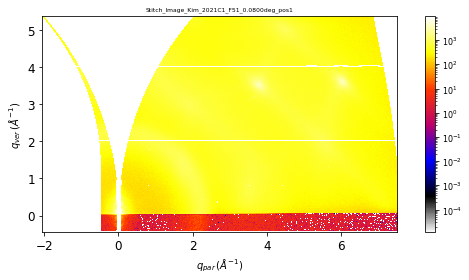

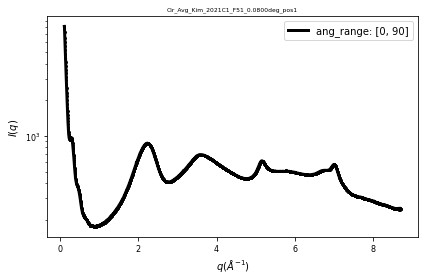

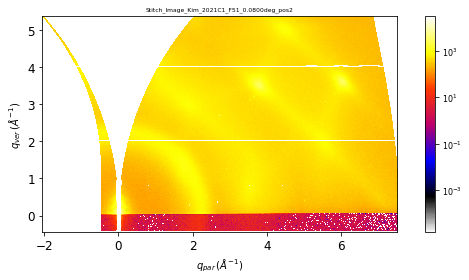

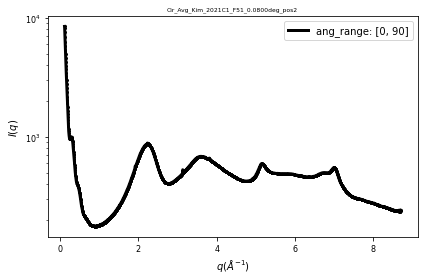

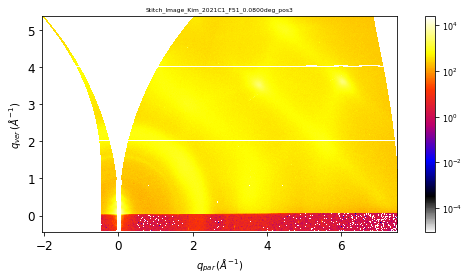

...

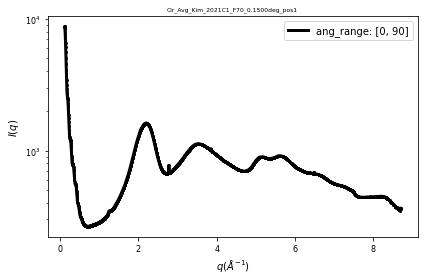

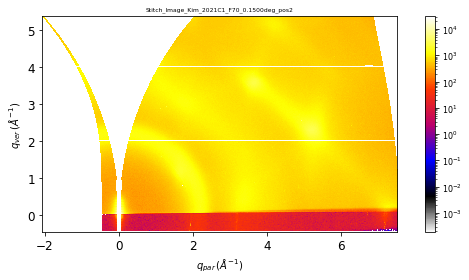

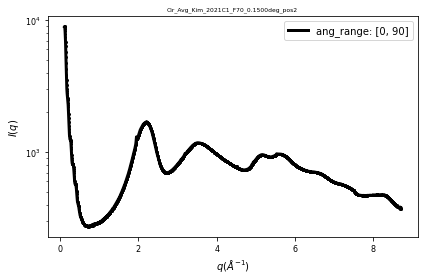

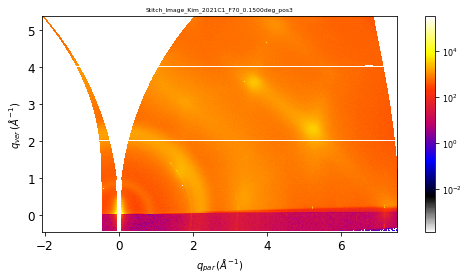

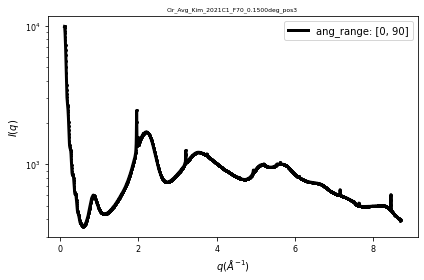

In [24]:
#loop samples
for sam in sample_list:     
    print( 'The sample is: %s.'%sam) 
    fps = Sam_dict[sam] 
    print( 'The filelist for this sample is: %s.'%fps)     
    full_filenames = [ inDir +  fp for fp in fps   ] 
    N =  len(full_filenames)        
    RES = {}
    RES['Data']={}
    PATH = 'GIWAXS'
    rot_angle = - np.arange( rot_angle_start,  rot_angle_step * N,  rot_angle_step )
    print('The rotation angles are: %s.'%rot_angle)
    pargs_sc['rotation_angles'] = rot_angle
    pargs_sc['outDir'] = create_fullpath( outDir + PATH + '/')          
    try:
        pz = float( re.search(   r'(_z)(.*)()', sam ).group()[2:]  )
    except:
        pz = 1400
    pargs_sc['sdd_mm'] = sdd_mm  - pz/1000.   
    
    p0 = re.search( r'([d][e][g])', sam  ).span()[0]
    inc = float( sam[ p0-6:p0] )
    print('The incident angle is: %s.'%inc)
    pargs_sc['incident_angle'] = inc 
        
    SC = SMI_Scattering( pargs_sc  ) 
    SC.md['sample'] = sam
    SC.load_data( full_filenames )   
    SC.saved_plots, SC.saved_data  = {}, {}    
    #######################################
    #plot the raw data
    ########################################
    if do_plot_raw:
        run_plot_raw( SC,  vmin= None, vmax=None,mask=None, fontsize=6, )        
    #######################################
    #Stitch WAXS data
    ########################################    
    SC.offset_y   =   - round( ( pz - 4250.0)/172.0,2 ) 
    
    SC.offset_y   = [28]*11
    SC.offset_y[1]   =  26
    SC.offset_y[2]   =  22    
    SC.offset_y[3]   =  20      
    SC.offset_y[4]   =  18    
    SC.offset_y[5]   =  18     
    SC.offset_y[6]   =  16    
    SC.offset_y[7]   =  14     
    SC.offset_y[8]   =  14  
    
    
    
    if check_stitch:        
        q_ch, iq_ch, int_dict_ch, qx_dict_ch, qz_dict_ch = SC.check_stitich( offset_y = SC.offset_y )  
        peaks = None 
        run_plot_waxs_check_stitch_SMI( SC, peaks =peaks,xlim= None, ylim=None,fontsize=6, ) 
    if do_stitch:        
        dq_mag = 5        
        qimg_st, msk_st, qx_st, qz_st, sca_st = SC.stitich( dq_mag = dq_mag, offset_y= SC.offset_y, flag_scale= T ) 
        
        if save_stitch_to_tiff:
            run_save_qimage( SC, dtype='qimg_st'  )         
        
        
        run_plot_qimage( SC, dtype='qimg_st', zlim=[.05, 1 ]   ) 
    else:      
    #######################################
    #Load Stitched WAXS data
    ########################################
        stitch_path = outDir + 'GIWAXS/Stitch_Data/'
        SC.qimg_st = get_img('Stitch_Data_%s.tiff'%sam, stitch_path) 
        SC.qmask_st = (SC.qimg_st != 0)
        SC.qx_st  = np.array( pds.read_csv( stitch_path + 'Stitch_Data_qx_%s.csv'%sam   )['qx_st'] )
        SC.qz_st  = np.array( pds.read_csv( stitch_path + 'Stitch_Data_qz_%s.csv'%sam   )['qz_st'] )        
    #######################################
    #Plot Stitch WAXS data
    ########################################   
    if do_plot_stich:   
        run_plot_qimage( SC, dtype='qimg_st', zlim=[.05, 1 ]   ) 
    #######################################
    #Do circular average
    ########################################  
    if do_Qciravg: 
        qz_roi_range= None
        qz_roi_range= [ 0.1,  qz_st.max() ]     
        
#         ################################
#         Thres = np.sort( np.ravel( SC.qimg_st ) )[ -ThresN ]
#         print( Thres )        
#         Mask = SC.qimg_st < Thres
#         SC.qmask_st *= Mask
#         #######################################
        
        
        qmaskn, q_ca,iq_ca,mask_ca = run_qciravg( SC, ciravg_bins=2500, Prange= [0,90], Qrange= None,
                                  qx_roi_range=None,qz_roi_range=qz_roi_range, dtype='qimg_st',    )
        run_save_ciravg(  SC  )  
        peaks = None 
        run_plot_ciravg( SC, peaks = peaks,xlim= None, ylim=None,fontsize=6, )  
        if show_Qciravg_roi:
            run_plot_qciravg_roi( SC,img_roi=SC.qimg_st*mask_ca,zlim=[.05, 1 ],fontsize=6,)  
        
    #######################################
    #Do sector circular average
    ########################################  
    if do_Qciravg_sector:  
        Prange =   [ [w-Qciravg_sector_angle_wid, w+Qciravg_sector_angle_wid] for w in  Qciravg_sector_angles  ]
        qiqs_cas,  qmask_cas = SC.qimg_circular_average_sector(SC.qimg_st , SC.qx_st, SC.qz_st,
                                    Qrange=None,Prange=Prange,bins=1500,mask= qmaskn ) 
        run_save_ciravg_sector( SC  )
        run_plot_ciravg_sector( SC, xlim=[0,8], )#ylim=[.1, 1e5]  )        
        if show_Qciravg_sector:
            run_plot_ciravg_sector_roi( SC  )    
            
    #######################################
    #Do q-phi analysis
    ########################################              
    if do_Qqphi:  
        qphi_bins = [ 500, 180 ];Prange= None;Qrange=None;            
        q_QP, phi_QP, qphi_QP, qphi_mask = SC.qimg_to_qphi(SC.qimg_st, SC.qx_st, SC.qz_st,
                                                  Qrange=Qrange,Prange=Prange,                                                      
                                                  bins=qphi_bins,mask=SC.qmask_st) 
        run_save_Qqphi( SC  )
        run_plot_Qqphi( SC,  fontsize=6, zlim=[.05, 1 ],aspect= 0.015, )
        
        if do_q_qphi:
            q_QPq,  iq_QPq = SC.qphi_to_iq( qphi_QP, q_range=q_QP, p_range=phi_QP, )
            run_save_Qqphi( SC   )
            run_plot_q_iq_qphi( SC, peaks = None, xlim= None, ylim=None,fontsize=6, )
            
        if do_p_qphi:  
            #q_range_roi = None 
            qPeak, iqPeak = find_max_peak(q_QPq,  iq_QPq, xrange=[0.1,6])
            q_range_roi = [ qPeak -.05,  qPeak + .05 ]
            p_QPp,  ip_QPp = SC.qphi_to_ip( qphi_QP, q_range=q_QP, p_range=phi_QP, Qrange=q_range_roi ) 
            run_save_q_iq_qphi( SC  )
            run_plot_p_ip_qphi( SC, peaks = None, xlim= None, ylim=None,fontsize=6, )                    
   ## save data to h5 file 
    res = SC.res_to_dict( save_raw=save_raw, do_stitch=do_stitch, 
                 do_ciravg = do_Qciravg, do_ciravg_sector = do_Qciravg_sector,
                 do_qimg=do_qimg, do_qphi = do_Qqphi,  
                do_q_qphi = do_q_qphi, do_p_qphi = do_p_qphi,                         
                        )                        
 
    RES['Data'] = res
    K='saved_data';SC.md[K] = SC.saved_data
    K='saved_plots';SC.md[K] = SC.saved_plots    
    RES['md']= SC.md  

    
    dicttoh5( RES, os.path.join(outDir_HDF, '%s.h5'%sam),
                     h5path='/%s/'%PATH, mode='a', overwrite_data=True)   
    
    
print('Done')       

        
    
    
    
    
    

# THE END

In [25]:
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/Scattering_Functions.py
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/Scattering.py
#%run -i /home/yuzhang/Software/pyScatt/pyScatt/packages.py